# FP_Group_25_CaDoD: **Phase 2** - Cats vs Dogs Detector (CaDoD)

In [ ]:
# Loading all necessary Python libraries
# This notebook was tested in Google Colab with our team Google Drive.
# If run on a local Jupyter, some libraries might need to be installed and Google Sheet&Drive permissions added.

import pandas as pd
import numpy as np
import tarfile
import warnings
import datetime as dt
from tqdm.notebook import tqdm
import os
import glob
from collections import Counter
from sklearn import set_config

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from PIL import Image
from IPython.display import display, HTML

from sklearn.model_selection import train_test_split
from sklearn.exceptions import ConvergenceWarning
from sklearn.linear_model import SGDClassifier, SGDRegressor
from sklearn.metrics import accuracy_score, mean_squared_error, roc_auc_score
from sklearn.datasets import make_classification
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.ensemble import RandomForestClassifier

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from time import time

from sklearn.metrics import classification_report
from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score

##Skimage/Preprocessing/Feature Engineering Libraries

In [ ]:
import PIL
from skimage import io
from skimage import data, exposure
from skimage.color import rgb2gray
from skimage import filters

from PIL import Image, ImageOps
import cv2
from skimage.feature import hog
from skimage.transform import rescale
from skimage import exposure
from time import time

import imageio
import imgaug as ia
import imgaug.augmenters as iaa
import matplotlib.patches as patches
import matplotlib

from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
%matplotlib inline

In [ ]:
# This section works only on the default Google Colab and not on Custom GCE VM or our local Jupyter Notebook
from google.colab import auth
from google.auth import default
from google.colab import drive
import gspread

'''
Authenticating against Google Sheets from the current Colab session
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''
auth.authenticate_user()
creds, _ = default()
gc = gspread.authorize(creds)


'''
Mounting Google Drive to the current Colab session
How to Connect Google Colab with Google Drive:
https://www.marktechpost.com/2019/06/07/how-to-connect-google-colab-with-google-drive/
'''
drive.mount('/content/drive')

Mounted at /content/drive


#2.1 Team Summary
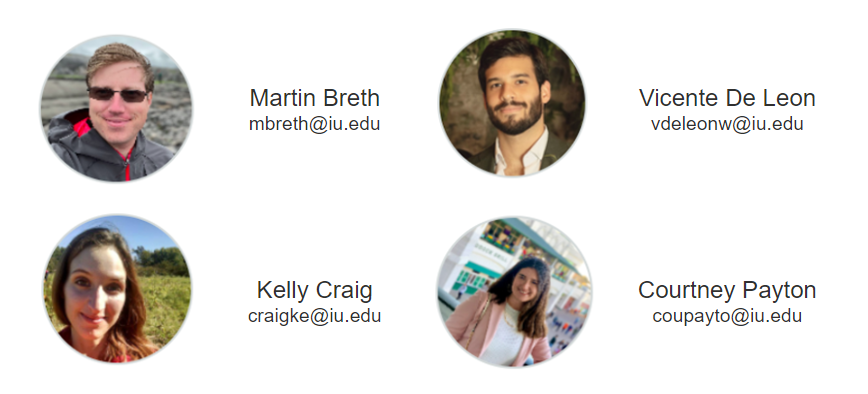

##2.1.1 Team Meeting Schedule

We are planning on meeting about 3 times per week. Due to our different schedules, we are not set on any specific days but we always pick the next meeting date&time based on how many tasks need to be reviewed and our availability.

Data below is based on [TeamTable](https://docs.google.com/spreadsheets/d/11MHZQm2NzXI2MFUvdr0GnMdnetwnpjp1DTNDPRtsnTo/edit?usp=sharing) Google Sheet.

Our meetings so far:

In [ ]:
'''
Loading content from a Google Sheets file and printing out the output
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''

# sheet 1 -> Leaders
# sheet 2 -> Meeting_Schedule
# sheet 3 -> Gantt_Chart
worksheet = gc.open('TeamTable').worksheet('Meeting_Schedule')   # Load only the "Meeting_Schedule" sheet from the TeamTable file

rows = worksheet.get_all_values()       # Get the list of all rows from a specific sheet

pd.set_option('display.max_colwidth', 0)
meetings = pd.DataFrame.from_records(rows[1:], columns=[rows[0]])    # Create a Pandas dataframe based on all the rows

meetings

,DATE,TIME,TOPICS
0,2023/03/22,4:00 PM,"Introductions, logistics 1, project preferences, etc."
1,2023/03/26,6:00 PM,"Picking the type of project, logistics 2, submitting Phase 0, starting Phase 1, etc."
2,2023/03/29,4:30 PM,"Updates, organizing tasks, sharing resources, etc."
3,2023/03/31,9:00 PM,"Updates, reviewing&helping with current tasks"
4,2023/04/02,10:00 AM,"Updates, wrapping up current tasks"
5,2023/04/03,8:00 PM,"Updates, finalizing Phase 1"
6,2023/04/04,6:00 PM,"Submitting Phase 1, dividing our work on classification and regression models"
7,2023/04/08,5:00 PM,"Phase 2 status update, classification and regression models progress, creating cloud environment, starting with the report, etc."
8,2023/04/09,7:00 PM,Phase 2 status update
9,2023/04/10,5:00 PM,"Phase 2 status update, working on report, final hyperparameter tuning in the cloud, etc."


##2.1.2 Phase Leader Plan

We have decided Phase leader will be responsible for these tasks (either doing them or delegating them):

*   Scheduling Zoom meetings
*   Reminding us about meetings (Discord or Canvas notifications)
*   Running meetings
*   Ensuring we finish all critical tasks
*   Adds and updates tasks
*   Submits the Phase assignment(s)
*   Creates and submits phase presentation

Data below is based on [TeamTable](https://docs.google.com/spreadsheets/d/11MHZQm2NzXI2MFUvdr0GnMdnetwnpjp1DTNDPRtsnTo/edit?usp=sharing) Google Sheet.

In [ ]:
'''
Loading content from a Google Sheets file and printing out the output
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''

# sheet 1 -> Leaders
# sheet 2 -> Meeting_Schedule
# sheet 3 -> Gantt_Chart
worksheet = gc.open('TeamTable').worksheet('Leaders')     # Load only the "Leaders" sheet from the TeamTable file

rows = worksheet.get_all_values()       # Get the list of all rows from a specific sheet

pd.set_option('display.max_colwidth', 0)
team = pd.DataFrame.from_records(rows[1:], columns=[rows[0]])         # Create a Pandas dataframe based on all the rows

team

,LEADER,PHASE
0,Vicente De Leon,1
1,Kelly Craig,2
2,Courtney Payton,3
3,Martin Berth,4


##2.1.3 Credit/Goals

Legend:

*   Phase - Identifies which phase the task is primarily for
*   Task - Short task identifier
*   End Date - This is the Due Date for a particular task
*   Assignee - Person or persons responsible for completing or delegating particular task
*   Credit - Person or persons who were involved in a particular task
*   Description - Long task description

Data below is based on [TeamTable](https://docs.google.com/spreadsheets/d/11MHZQm2NzXI2MFUvdr0GnMdnetwnpjp1DTNDPRtsnTo/edit?usp=sharing) Google Sheet.

In [ ]:
'''
Loading content from a Google Sheets file
Google Snippets Colab Notebook:
https://colab.research.google.com/notebooks/snippets/sheets.ipynb
'''

# sheet 1 -> Leaders
# sheet 2 -> Meeting_Schedule
# sheet 3 -> Gantt_Chart
worksheet = gc.open('TeamTable').worksheet('Gantt_Chart')     # Load only the "Gantt_Chart" sheet from the TeamTable file

rows = worksheet.get_all_values()       # Get the list of all rows from a specific sheet
pd.set_option('display.max_colwidth', 0)
pd.set_option('display.max_rows', 500)

goals = pd.DataFrame.from_records(rows[6:], columns=[rows[5]])         # Create a Pandas dataframe based on all the rows

goals = goals[['PHASE', 'TASK', 'ASSIGNEE', 'CREDIT', 'DESCRIPTION']]   # Select only relevant columns
goals.columns = ['PHASE', 'TASK', 'ASSIGNEE', 'CREDIT', 'DESCRIPTION']   # Correct the columns

# Ignore columns with "Phase n" and hide Panda's index column
display(goals.loc[~goals['TASK'].isin(['Phase 0', 'Phase 1', 'Phase 2' ,'Phase 3', 'Phase 4'])].style.hide(axis="index"))

PHASE,TASK,ASSIGNEE,CREDIT,DESCRIPTION
,,,,
0,Team logistics,Vicente,"Courtney, Kelly, Martin, Vicente","We will decide on the team logistics and create them (creating a zoom room for meetings, creating Discord server for communication, creating a shared Google Drive location, selecting leaders for each week, etc.). We will individually research which project type we prefer to work on. Finally we will decide on the type of project."
0,Submitting Phase 0,Martin,"Courtney, Kelly, Martin, Vicente",We will meet and Martin will submit the Phase 0 assignment while sharing his screen.
0,Google Colab testing,Vicente,"Martin, Vicente",We will test how to use Google Colab. We will test sharing data between an instance of Google Colab notebook and shared Google Drive directory. We will research paid versions of Google Colab which include GPU for future project phases.
1,Research importing tables into Colab,Vicente,Vicente,"We will research and test inserting data for Leaders, Credit, and Goals as tables into a testing Google Colab notebook for proposal for Phase 1."
1,Test running notebooks on our systems,Martin,"Courtney, Kelly, Martin, Vicente","Since training models in paid Colab can become expensive with time, we will ensure we all can run our code both in Google Colab and locally on our workstations (this will be especially interesting with 3 different OS types and x64 and Apple M CPUs) . We will verify if the provided Docker container is suitable for running CPU/GPU intensive notebooks or if we will need to use Jupyter notebooks directly on our workstations."
1,Create goals in Google Sheets,Martin,Martin,"We will finish scoping goals in Google Doc and will move them into Google Sheets file. We will ensure they are presentable for Leaders, Credit, and Goal sections in the proposal for Phase 1."
1,Provide a baseline coding notebook (local and Colab),Courtney,Courtney,We will have a starting code for testing both local Jupyter notebook and Google Colab.
1,Baseline classification pipeline (SKLearn),Vicente,"Vicente, Courtney",We will research a baseline classification pipeline in SKLearn. We will also describe it for the proposal in Phase 1.
1,Baseline regression pipeline (SKLearn),Martin,Martin,We will research a baseline regression pipeline in SKLearn. We will also describe it for the proposal in Phase 1.


##2.1.4 Gantt Chart

This chart represents our currently planed schedule which is based on our current best estimates and likely will change.

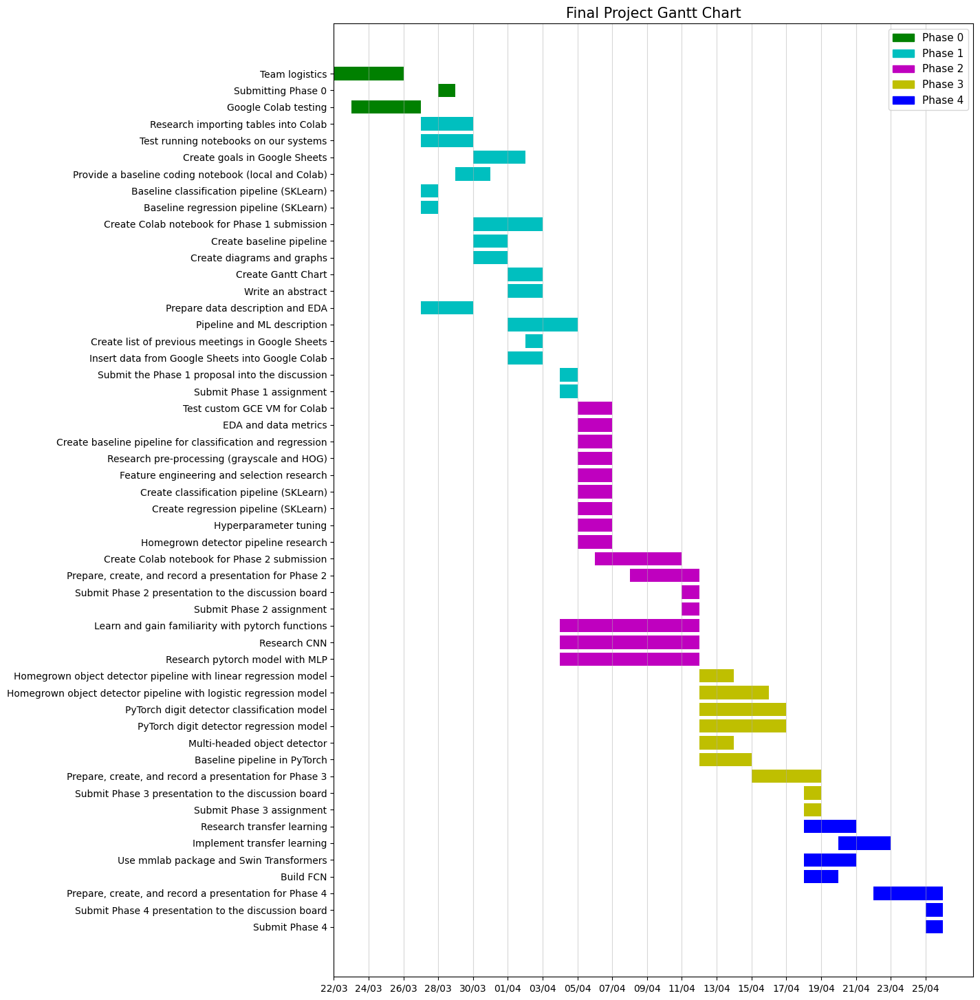

In [ ]:
# Code to create dataframe for Gantt Chart table
'''
How to get a Gantt plot using matplotlib?:
https://www.tutorialspoint.com/how-to-get-a-gantt-plot-using-matplotlib
'''

gc = gspread.authorize(creds)
worksheet = gc.open('TeamTable').worksheet('Gantt_Chart')   # Load only the "Gantt_Chart" sheet from the file
rows = worksheet.get_all_values() # get_all_values gives a list of rows

pd.set_option('display.max_colwidth', 0)
# Create dataframe
gantt = pd.DataFrame.from_records(rows[7:], columns=[rows[5]])
# Keep first 3 columns
gantt = gantt.iloc[:, 1:4]
# Give column names
gantt.columns = ['TASK','START DATE','END DATE']
# Drop Phase rows
index_num = gantt[(gantt['TASK'] == 'Phase 0')|(gantt['TASK'] == 'Phase 1')|(gantt['TASK'] == 'Phase 2')|(gantt['TASK'] == 'Phase 3')|(gantt['TASK'] == 'Phase 4')].index
gantt = gantt.drop(index_num)
# gantt

# Create a gantt chart

# convert to datetime
gantt['START DATE']= pd.to_datetime(gantt['START DATE'])
gantt['END DATE']= pd.to_datetime(gantt['END DATE'])

# Create new columns
gantt['days_to_start'] = (gantt['START DATE'] - gantt['START DATE'].min()).dt.days
gantt['days_to_end'] = (gantt['END DATE'] - gantt['START DATE'].min()).dt.days
gantt['task_duration'] = gantt['days_to_end'] - gantt['days_to_start'] + 1  # to include also the end date
gantt['Phase'] = ['Phase 0'] * 3 + ['Phase 1'] * 17 + ['Phase 2'] * 16 + ['Phase 3'] * 9 + ['Phase 4'] * 7

# Create Gantt Chart
team_colors = {'Phase 0': 'g', 'Phase 1': 'c', 'Phase 2': 'm', 'Phase 3': 'y', 'Phase 4': 'b'} # dictionary with the team names as its keys and base matplotlib colors as its values
fig, ax = plt.subplots()
fig.set_size_inches(12, 18)

for index, row in gantt.iterrows():
  plt.barh(y=row['TASK'], width=row['task_duration'], left=row['days_to_start'], color=team_colors[row['Phase']])

plt.title('Final Project Gantt Chart', fontsize=15)
plt.gca().invert_yaxis()
xticks = np.arange(0, gantt['days_to_end'].max()+2, 2) 
xticklabels = pd.date_range(start=gantt['START DATE'].min(), end=gantt['END DATE'].max()).strftime("%d/%m")

# ticks
ax.set_xticks(xticks)

ax.set_xticklabels(xticklabels[::2])
# axis
ax.xaxis.grid(True, alpha=0.5) 
# Adding a legend
patches = []
for team in team_colors:
    patches.append(matplotlib.patches.Patch(color=team_colors[team]))
ax.legend(handles=patches, labels=team_colors.keys(), fontsize=11) 
plt.show()

#2.2 Project Abstract

The goal of this project aims to develop optimal cat and dog image detection machine learning techniques. In this phase we will be implementing both classification and regression models. Our main goal is to improve accuracy of the models, and to achieve this, we will implement various preprocessing steps on the image set. These steps include reshaping, rotation, cropping, flipping vertically and horizontally, and gamma contrast. For optimal performance, feature extraction will be utilized via a custom histogram of oriented gradients (HOG) algorithm. Two regression models will be developed to predict bounding boxes, one with and one without hyperparameter tuning. To optimize these models, we will be using ridge, lasso and elastic net optimizers. For classification, models will be created using logistic regression with Stochastic gradient descent and support vector classifiers. In the subsequent phases, we plan to refine our evaluation metrics and efficiency to further improve our models’ performance. Overall, our model performed well with best metrics of regression MSE of 0.01, classification train accuracy of 0.608, and test of 0.594.

#2.3 Project Description

The goal of this project is to create machine learning pipelines for classification and object detection of cat and dog images. The dataset for this project includes 12,966 RGB colored cat and dog images and image bounding box information. We performed the following preprocessing steps: rescaled the images to be all the same size, took the RGB intensity values and flattened them from a 3D array to a 2D array, and image augmentation. After preprocessing we conducted feature engineering with histogram of oriented gradients (HOG) algorithm. This data entered into our regression and classification pipelines with parameter tuning. The regression model was built to predict an accurate bounding box around a cat or dog in an image. We accomplished this by using a linear regression model and we optimized the model by testing ridge, lasso, and elastic net regularization techniques. Our classification pipeline was created to predict whether an image contained a cat or dog. We optimized the classification prediction by testing logistical regression, SVM, SVG Classifcation. 

**Accuracy Equation:**
$${Accuracy} = \dfrac {c}{n} $$

Notation:
\begin{align}
c &\quad \text{Number  of  correct  predictions}\\
n &\quad \text{Total number of predictions}\\
\end{align}


**MSE Equation:**
Loss function that works for multiple alogorithms including logistic regression

\begin{equation}\tag{Reference: Lab 4 Linear Regression}
MSE(\boldsymbol{\theta}) = f(\boldsymbol{\theta}) = \frac{1}{m}\sum_{i=1}^{m}\left[ \mathbf{x}_i\cdot\boldsymbol{\theta} - y_i\right]^2
\end{equation}

Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align}

**RMSE Equation**
Root mean squared error function is just the square root of the mean squared error


\begin{align}\tag{Reference: Lab 4 Linear Regression}
\text{RMSE}(\mathbf{X}, h_{\mathbf{\theta}}) 
=  \sqrt{\dfrac{1}{m} \sum\limits_{i=1}^{m}{( \mathbf{x}^{(i)}\cdot \mathbf{\theta} - y^{(i)})^2}}
\end{align}

Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align}

**MAE Equation**
\begin{align}\tag{Reference: Lab 4 Linear Regression}
\text{MAE}(\mathbf{X}, h_{\mathbf{\theta}}) = \dfrac{1}{m} \sum\limits_{i=1}^{m}{| \mathbf{x}^{(i)}\cdot \mathbf{\theta} - y^{(i)}|}
\end{align}

Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align

**CXE Equation:**
Cross entropy loss function
\begin{align}\tag{Reference: Lab 7 Logistic Regression}
J(\boldsymbol{\Theta}) = - \dfrac{1}{m}\sum\limits_{i=1}^{m}\sum\limits_{k=1}^{K}{y_k^{(i)}\log\left(\hat{p}_k^{(i)}\right)}
\end{align}

Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
K &\quad \text{number of classes}\\
y &\quad \text{target class}\\
\hat{p} &\quad \text{probability for classes}\\
\end{align}

**Confusion Matrix Equations**
For confusion matrices, we will be using precision and F-1 score

Notation:
\begin{align}
TP &\quad \text{True Positives in matrix}\\
TN &\quad \text{True Negatives in matrix}\\
FP &\quad \text{False Positives in matrix}\\
FN &\quad \text{False Negatives in matrix}\\
\end{align}

**Precision**

\begin{align}
\text{Precison} = \dfrac{TP}{TP+FP}
\end{align}

**F1 Score**

\begin{align}
\text{F1 Score} = 2\cdot\dfrac{Precision⋅Recall}{Precision+Recall}
\end{align}

Where:
\begin{align}
\text{Recall} = \dfrac{TP}{TP+FN}
\end{align}



##2.3.1 Machine Learning Baseline Pipelines

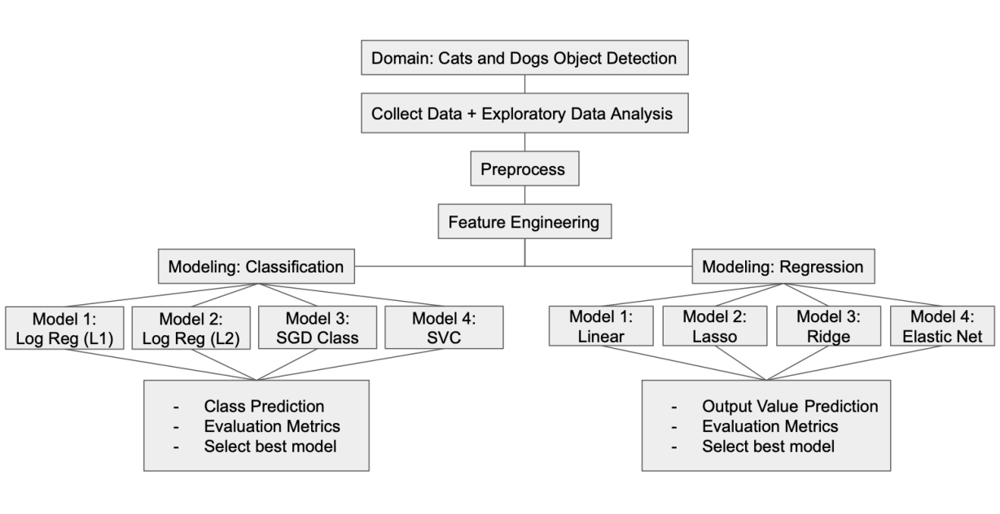

##2.3.2 Data Description

The data set for this project contains 12,966 RGB images of cats and dogs with various shapes and aspect ratios. In addition, data containing image bounding box coordinates of the object are stored in a .csv file. There are 6,855 data points classified as dogs and 6,111 as cats.
The image bounding box file contains the following information:

* ImageID - the image ID	
* Source - 	How the bounding box was created. 
    * xclick - manually drawn boxes
    * activemil - enhanced method and human verified. 
* LabelName	- object class ID
* Confidence - dummy value of 1	
* XMin, XMax, YMin, YMax - coordinates of the box, in normalized image coordinates. XMin is in [0,1], where 0 is the leftmost pixel, and 1 is the rightmost pixel in the image. Y coordinates go from the top pixel (0) to the bottom pixel (1).
* IsOccluded - 1 if the object is occluded by another object in the image. 
* IsTruncated - 1 if the object is trunacated in the image. 	
* IsDepiction - 1 if the object is not a real physical instance. 
* IsInside - 1 if the picture taken from the inside of a object 
* XClick1X, XClick2X, XClick3X, XClick4X, XClick1Y, XClick2Y, XClick3Y, XClick4Y - normalized image coordinates of the four extreme points of the object that produced the box. 

# 2.4 Exploratory data analysis (EDA)

The code below reads the dataset and loads it into memory.

In [ ]:
# Loading Variables
# These 2 lines below can be changed based on what you want to run:
dataset = 'cadod.csv'                             # cadod.csv  or cadod_experimental.csv
gdrive_directory = 'aml'           # This is your personal GDrive directly. For example in Vicente's case: MLProject

################################
# You do not need to edit these variables
colab_path = '/content/drive/MyDrive/' + gdrive_directory + '/aml'
images_path = colab_path + '/images'
# images_resized_path = images_path + '/resized'

In [ ]:
# df = pd.read_csv(colab_path + '/' + dataset)
df = pd.read_csv(colab_path + '/' + dataset)

In [ ]:
# Image Bounding Box File

In [ ]:
# List the first 5, last 5, and random 5 rows from the Bounding Box File. This gives us a quick overview of the data.
display(df.head())
print()
display(df.tail())
print()
display(df.sample(n=5))

,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,...,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
0,0000b9fcba019d36,xclick,/m/0bt9lr,1,0.165000,0.903750,0.268333,0.998333,1,1,...,0,0,0.636250,0.903750,0.748750,0.165000,0.268333,0.506667,0.998333,0.661667
1,0000cb13febe0138,xclick,/m/0bt9lr,1,0.000000,0.651875,0.000000,0.999062,1,1,...,0,0,0.312500,0.000000,0.317500,0.651875,0.000000,0.410882,0.999062,0.999062
2,0005a9520eb22c19,xclick,/m/0bt9lr,1,0.094167,0.611667,0.055626,0.998736,1,1,...,0,0,0.487500,0.611667,0.243333,0.094167,0.055626,0.226296,0.998736,0.305942
3,0006303f02219b07,xclick,/m/0bt9lr,1,0.000000,0.999219,0.000000,0.998824,1,1,...,0,0,0.508594,0.999219,0.000000,0.478906,0.000000,0.375294,0.720000,0.998824
4,00064d23bf997652,xclick,/m/0bt9lr,1,0.240938,0.906183,0.000000,0.694286,0,0,...,0,0,0.678038,0.906183,0.240938,0.522388,0.000000,0.370000,0.424286,0.694286


,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,...,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
12961,ffc65ce637cbd73d,xclick,/m/01yrx,1,0.135000,0.844375,0.000000,0.999167,0,1,...,0,0,0.176875,0.135000,0.450625,0.844375,0.000000,0.685000,0.999167,0.995000
12962,ffd1e6a91d92bf83,xclick,/m/01yrx,1,0.000625,0.999375,0.005000,0.825000,1,1,...,0,0,0.220625,0.125000,0.000625,0.999375,0.825000,0.005000,0.261667,0.303333
12963,ffe91ea1debeefb3,xclick,/m/01yrx,1,0.001475,0.988201,0.042406,0.624260,1,1,...,0,0,0.473451,0.001475,0.019174,0.988201,0.042406,0.327416,0.624260,0.358974
12964,ffebb214b9df34aa,xclick,/m/01yrx,1,0.000000,0.998125,0.037523,0.999062,0,1,...,0,0,0.000000,0.399375,0.998125,0.581250,0.676360,0.037523,0.560976,0.999062
12965,fffcbea446a0b7b9,xclick,/m/01yrx,1,0.148045,0.999069,0.070640,0.947020,0,1,...,0,0,0.558659,0.148045,0.808194,0.999069,0.070640,0.370861,0.947020,0.835541


,ImageID,Source,LabelName,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,...,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
4337,9d22da1e9caa418e,xclick,/m/0bt9lr,1,0.000000,0.893750,0.000000,0.999163,0,1,...,0,0,0.120625,0.000000,0.893750,0.561875,0.000000,0.184937,0.897908,0.999163
5185,bc9770bf4c2d4121,xclick,/m/0bt9lr,1,0.001250,0.915625,0.000000,0.868333,0,1,...,0,0,0.290625,0.001250,0.860625,0.915625,0.000000,0.527500,0.868333,0.746667
6979,0122ed068d6d0d40,xclick,/m/01yrx,1,0.181250,0.880625,0.067500,0.902500,0,0,...,0,0,0.307500,0.880625,0.181250,0.367500,0.067500,0.504167,0.395000,0.902500
12797,f7e71b714f18a026,xclick,/m/01yrx,1,0.317647,0.998824,0.000000,0.998230,0,1,...,0,0,0.748235,0.998824,0.830588,0.317647,0.000000,0.495575,0.998230,0.631858
11892,ce6ee11659b2f914,xclick,/m/01yrx,1,0.181250,0.940625,0.060417,0.997917,1,1,...,0,0,0.206250,0.181250,0.496875,0.940625,0.060417,0.600000,0.997917,0.668750


In [ ]:
# Descriptive statistics
df.describe()

,Confidence,XMin,XMax,YMin,YMax,IsOccluded,IsTruncated,IsGroupOf,IsDepiction,IsInside,XClick1X,XClick2X,XClick3X,XClick4X,XClick1Y,XClick2Y,XClick3Y,XClick4Y
count,12966.0,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000,12966.000000
mean,1.0,0.099437,0.901750,0.088877,0.945022,0.464754,0.738470,0.013651,0.045427,0.001157,0.390356,0.424582,0.494143,0.506689,0.275434,0.447448,0.641749,0.582910
std,0.0,0.113023,0.111468,0.097345,0.081500,0.499239,0.440011,0.118019,0.209354,0.040229,0.358313,0.441751,0.405033,0.462281,0.415511,0.401580,0.448054,0.403454
min,1.0,0.000000,0.408125,0.000000,0.451389,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,1.0,0.000000,0.830625,0.000000,0.910000,0.000000,0.000000,0.000000,0.000000,0.000000,0.221292,0.096875,0.285071,0.130000,0.024323,0.218333,0.405816,0.400000
50%,1.0,0.061250,0.941682,0.059695,0.996875,0.000000,1.000000,0.000000,0.000000,0.000000,0.435625,0.415625,0.531919,0.623437,0.146319,0.480838,0.825000,0.646667
75%,1.0,0.167500,0.998889,0.144853,0.999062,1.000000,1.000000,0.000000,0.000000,0.000000,0.609995,0.820000,0.787500,0.917529,0.561323,0.729069,0.998042,0.882500
max,1.0,0.592500,1.000000,0.587088,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.999375,0.999375,1.000000,0.999375,0.999375,0.999375,1.000000,0.999375


In [ ]:
# Print a concise summary of the bounding box file. 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12966 entries, 0 to 12965
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   ImageID      12966 non-null  object 
 1   Source       12966 non-null  object 
 2   LabelName    12966 non-null  object 
 3   Confidence   12966 non-null  int64  
 4   XMin         12966 non-null  float64
 5   XMax         12966 non-null  float64
 6   YMin         12966 non-null  float64
 7   YMax         12966 non-null  float64
 8   IsOccluded   12966 non-null  int64  
 9   IsTruncated  12966 non-null  int64  
 10  IsGroupOf    12966 non-null  int64  
 11  IsDepiction  12966 non-null  int64  
 12  IsInside     12966 non-null  int64  
 13  XClick1X     12966 non-null  float64
 14  XClick2X     12966 non-null  float64
 15  XClick3X     12966 non-null  float64
 16  XClick4X     12966 non-null  float64
 17  XClick1Y     12966 non-null  float64
 18  XClick2Y     12966 non-null  float64
 19  XCli

In [ ]:
# Check for any NA values
df.isnull().sum()

ImageID        0
Source         0
LabelName      0
Confidence     0
XMin           0
XMax           0
YMin           0
YMax           0
IsOccluded     0
IsTruncated    0
IsGroupOf      0
IsDepiction    0
IsInside       0
XClick1X       0
XClick2X       0
XClick3X       0
XClick4X       0
XClick1Y       0
XClick2Y       0
XClick3Y       0
XClick4Y       0
dtype: int64

In [ ]:
# Check data type of each column
df.dtypes

ImageID        object 
Source         object 
LabelName      object 
Confidence     int64  
XMin           float64
XMax           float64
YMin           float64
YMax           float64
IsOccluded     int64  
IsTruncated    int64  
IsGroupOf      int64  
IsDepiction    int64  
IsInside       int64  
XClick1X       float64
XClick2X       float64
XClick3X       float64
XClick4X       float64
XClick1Y       float64
XClick2Y       float64
XClick3Y       float64
XClick4Y       float64
dtype: object

In [ ]:
# List how much memory each column uses in bytes.
# This could be useful if we were working with truly large data sets and memory would be a constrain.
df.memory_usage()

Index          128   
ImageID        103728
Source         103728
LabelName      103728
Confidence     103728
XMin           103728
XMax           103728
YMin           103728
YMax           103728
IsOccluded     103728
IsTruncated    103728
IsGroupOf      103728
IsDepiction    103728
IsInside       103728
XClick1X       103728
XClick2X       103728
XClick3X       103728
XClick4X       103728
XClick1Y       103728
XClick2Y       103728
XClick3Y       103728
XClick4Y       103728
dtype: int64

In [ ]:
# List counts of unique values in each column. This is useful for determining if the variable is categorical.
df.nunique()

ImageID        12966
Source         2    
LabelName      2    
Confidence     1    
XMin           3109 
XMax           3499 
YMin           4822 
YMax           4219 
IsOccluded     3    
IsTruncated    3    
IsGroupOf      3    
IsDepiction    3    
IsInside       3    
XClick1X       5135 
XClick2X       4763 
XClick3X       5074 
XClick4X       4659 
XClick1Y       6351 
XClick2Y       7314 
XClick3Y       6252 
XClick4Y       7180 
dtype: int64

In [ ]:
# Get the rows and columns of the bounding box data file.
print(f"There are {df.shape[0]} rows and {df.shape[1]} columns")

There are 12966 rows and 21 columns


In [ ]:
# Number of dog vs cat labels.
# The counts of cats and dogs was close enough that we concluded not to do any sample balancing.
df.LabelName.replace({'/m/01yrx':'cat', '/m/0bt9lr':'dog'}, inplace=True)
df.LabelName.value_counts()

dog    6855
cat    6111
Name: LabelName, dtype: int64

##  2.4.1 Image Class Count comparisions

This is a bar plot of the image class count for dogs and cats. There are 6,855 dog images and 6,111 cat images. 

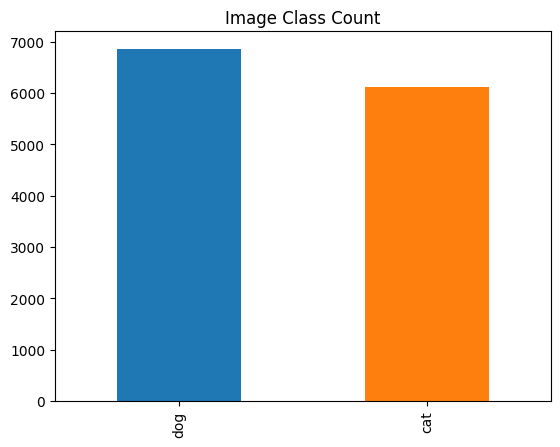

In [ ]:
# Plot the image count of dogs vs cats.
# The counts of cats and dogs was close enough that we concluded not to do any sample balancing.
df.LabelName.value_counts().plot(kind='bar', color=['tab:blue', 'tab:orange'])
plt.title('Image Class Count')
plt.show()

This is a plot of counts of objects being occluded, truncated, group of, and depiction between each class. This can help answer if a specific object happens to be more occluded, truncated, etc.

The count of occluded dog images is marginally higher than cat images. This is a topic we could purse in future project phases.
Graphs depicting truncation, grouping, depiction were close enough we did not see an issue for our analysis.

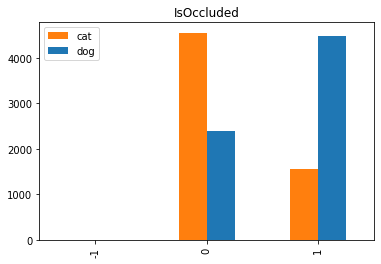

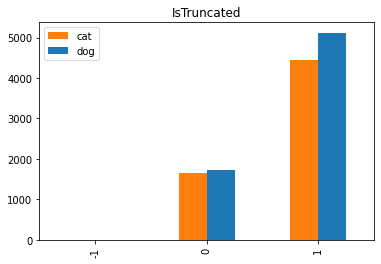

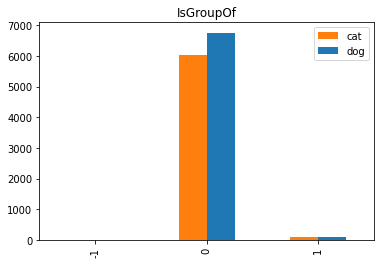

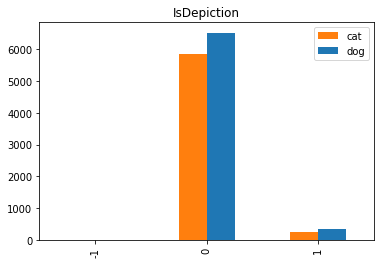

In [ ]:
labels = ['IsOccluded', 'IsTruncated', 'IsGroupOf', 'IsDepiction']

for label in labels:

  data = pd.DataFrame(df[label].loc[df['LabelName'] == 'cat'].value_counts().to_frame(name='cat'))
  data['dog'] = df[label].loc[df['LabelName'] == 'dog'].value_counts().to_frame()
  data.fillna(0).sort_index().plot.bar(title=label, color=['tab:orange', 'tab:blue'])

In [ ]:
# Plot comparision of the bounding box areas between each class

This is a histogram of the bounding box coordinates. This shows that most of the clicks start at the edge of the image, which could mean the image or object is cropped. Ideally, the object would be somewhere in the middle.

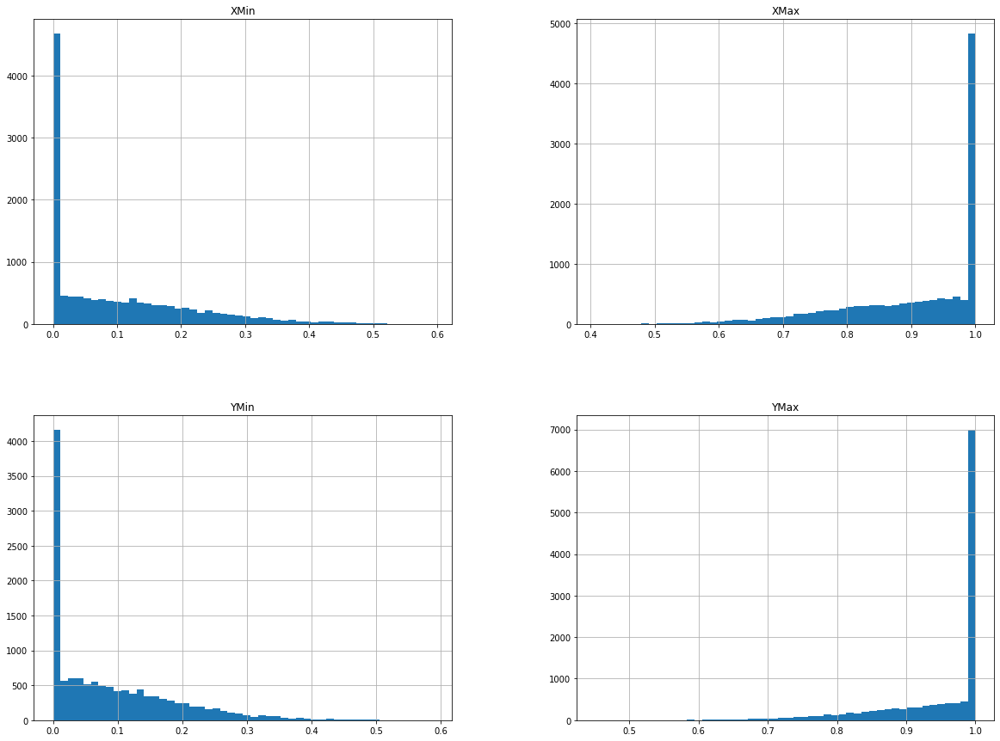

In [ ]:
df[['XMin', 'XMax', 'YMin', 'YMax']].hist(bins=50, figsize=(20,15))
plt.show()

## 2.4.2 Correlation Matrix for the bounding box data
This is the correlation matrix with the range from +1 to -1 where +1 is highly and positively correlated and -1 will be highly negatively correlated.
XClick1X, XClick2X, XClick3X, XClick4X, XClick1Y, XClick2Y, XClick3Y, and XClick4Y columns are correlated. 


<ipython-input-25-0c1984e3d8f1>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()
<ipython-input-25-0c1984e3d8f1>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr())


<Axes: >

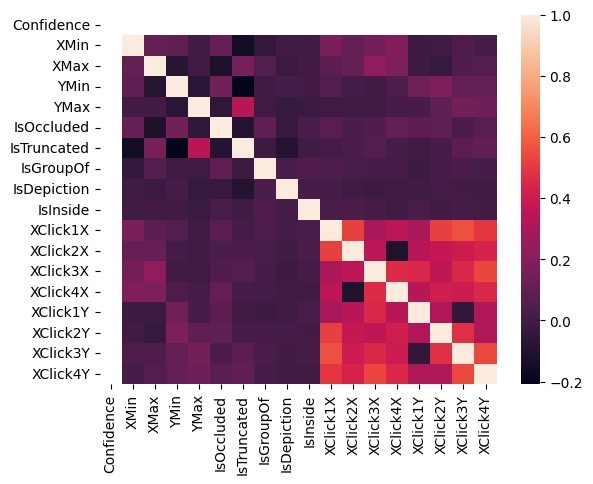

In [ ]:
# Create correlation matrix of the bounding box image data.
df.corr()
sns.heatmap(df.corr())

In [ ]:
# Installing ydata_profiling library since Colab does not have it by default
!pip install ydata_profiling

from ydata_profiling import ProfileReport

## 2.4.3 Profile report of the bounding box data.
The profile report consist of the following:

1) **Overview:** provides statistical information about the dataset.

2) **Variables:** detailed statistics of each of the columns and a histogram of the data distribution.

3) **Interactions:** interactive plot to compare interactions between two varaibles.

4) **Correlations:** heat map of correlation between variables.

5) **Missing values:** bar graph of the count of missing values for each variable. 

6) **Sample:** displays for 10 rows and last 10 rows of data set. 


In [ ]:
#Create Profile Report

profile = ProfileReport(df, title="Cat and Dogs Dataset", explorative=True)
profile

Output hidden; open in https://colab.research.google.com to view.

##  2.4.4 Showing examples of images

In [ ]:
# Get image counts for cats and dogs
print(f"There are a total of {len(glob.glob1(images_path, '*.jpg'))} cat and dog images")

There are a total of 12966 cat and dog images


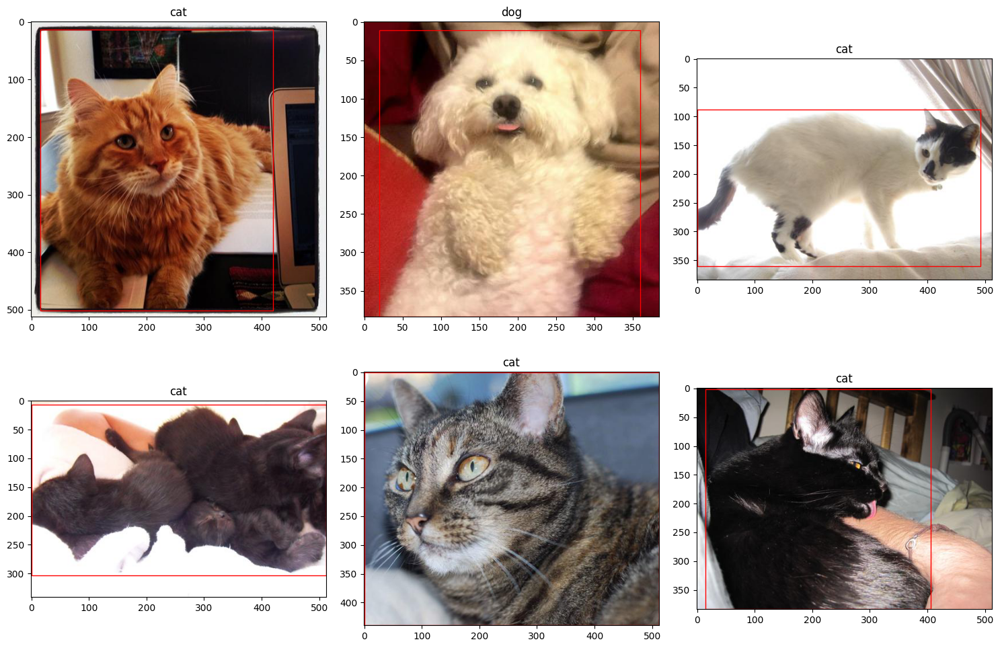

In [ ]:
# plot random 6 images
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(df.shape[0], size=6, replace=False)):
    img = mpimg.imread(images_path + "/" + df.ImageID.values[j] + '.jpg')
    h, w = img.shape[:2]
    coords = df.iloc[j,4:8]
    ax[i].imshow(img)
    ax[i].set_title(df.LabelName[j])
    ax[i].add_patch(plt.Rectangle((coords[0]*w, coords[2]*h), 
                                  coords[1]*w-coords[0]*w, coords[3]*h-coords[2]*h, 
                                  edgecolor='red', facecolor='none'))

plt.tight_layout()
plt.show()

##  2.4.5 Showing examples of outlier images

Below are images which are in some way outlier: blurry, cartoon, occluded, too dark, too bright, partial object, flipped.

Some of these outlier examples are addressed via our augmentation library during preprocessing.

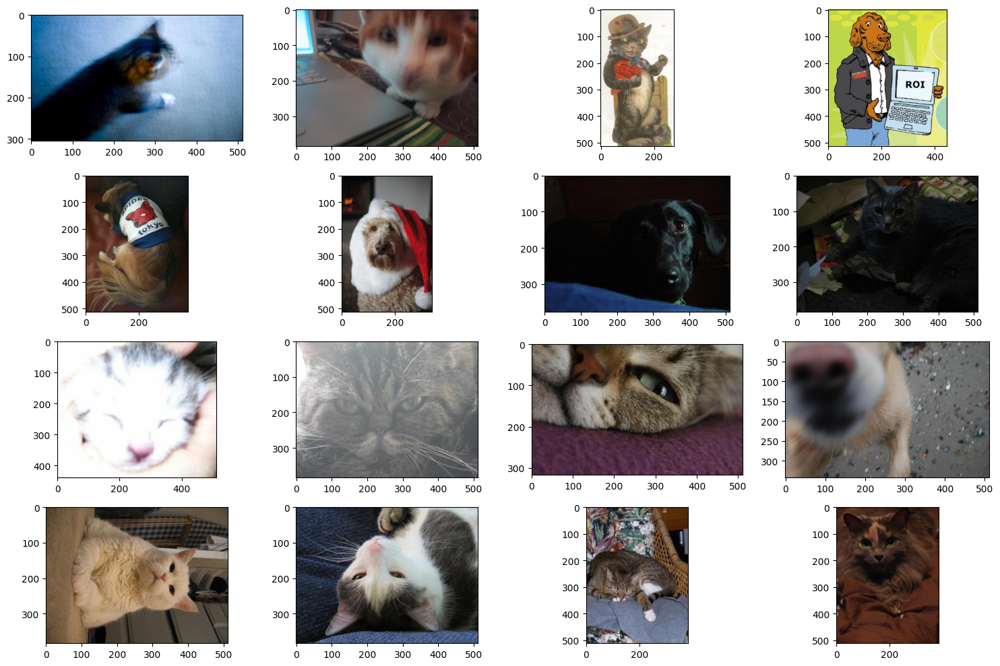

In [ ]:
blurry = ['e27ad5d58d77bc85.jpg', '8e14f38acd47a09e.jpg']
cartoon = ['b8b0fad7a9eadc36.jpg', 'bedd2b75d3b488a5.jpg']
occluded = ['c83ba2e96cc0be03.jpg', '262b39e80c5c4e54.jpg']
dark = ['c874ebff7fe303ea.jpg', 'cc6d3007c1075e8b.jpg']
bright = ['b86fa94eda8a4614.jpg', '82c8a46e8e075bc8.jpg']
partial = ['b5e220f05ab2cbf6.jpg','b8fc8f56ec2b8e60.jpg']
flipped = ['ca820b7abd683d22.jpg', 'e256b36ed438c41e.jpg']
busy_background = ['e0b29943e1c54b65.jpg','d728520f0c093553.jpg']

extreme_pictures = blurry + cartoon + occluded + dark + bright + partial + flipped + busy_background

fig, ax = plt.subplots(nrows=4, ncols=4, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(extreme_pictures):
    img = mpimg.imread(images_path + '/' + j)
    ax[i].imshow(img)

plt.tight_layout()
plt.show()

In [ ]:
# Go through all images and record the shape of the image in pixels and the memory size
img_shape = []
img_size = np.zeros((df.shape[0], 1))

for i,f in enumerate(tqdm(df['ImageID'])):
    file = images_path + '/' + f + '.jpg'
    img = Image.open(file)
    img_shape.append(f"{img.size[0]}x{img.size[1]}")
    img_size[i] += os.path.getsize(file)

  0%|          | 0/12966 [00:00<?, ?it/s]

In [ ]:
#Count all the different image shapes
img_shape_count = Counter(img_shape)
# create a dataframe for image shapes
img_df = pd.DataFrame(set(img_shape_count.items()), columns=['img_shape','img_count'])

In [ ]:
#There are a ton of different image shapes. Let's narrow this down by getting a 
#sum of any image shape that has a cout less than 100 and put that in a category called other
img_df = img_df.append({'img_shape': 'other','img_count': img_df[img_df.img_count < 100].img_count.sum()}, 
                       ignore_index=True)
#Drop all image shapes
img_df = img_df[img_df.img_count >= 100]
#Check if the count sum matches the number of images
img_df.img_count.sum() == df.shape[0]

<ipython-input-18-cad1beb13529>:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  img_df = img_df.append({'img_shape': 'other','img_count': img_df[img_df.img_count < 100].img_count.sum()},


True

##  2.4.4 Bar Graph of Image Shape Counts

This is a bar plot of the all the image shape counts. The "other" category includes all of the image shapes that have a count of less than 100. 512x384 is the image size that occurs the most.  

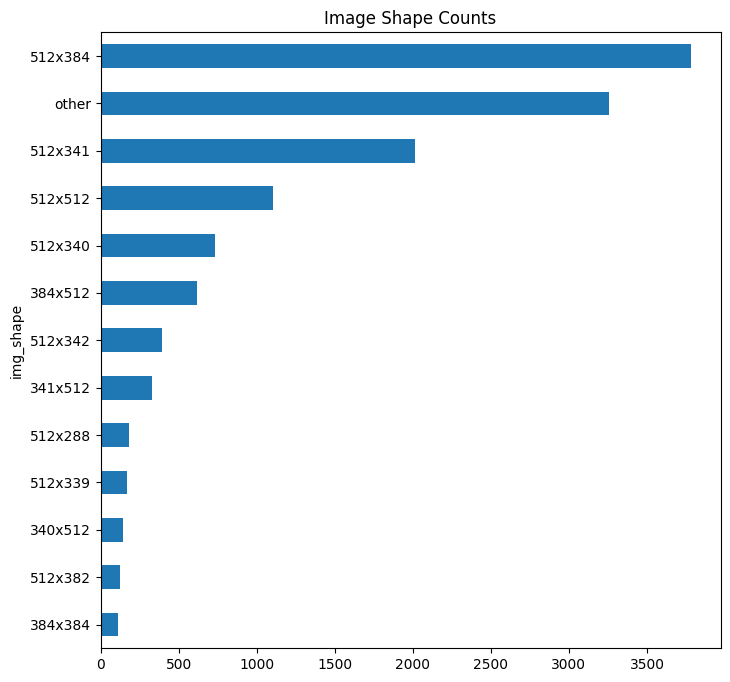

In [ ]:
#Plot image shape counts
img_df.sort_values('img_count', inplace=True)
img_df.plot(x='img_shape', y='img_count', kind='barh', figsize=(8,8), legend=False)
plt.title('Image Shape Counts')
plt.show()

In [ ]:
# convert to megabytes
img_size = img_size / 1000

##  2.4.5 Plots of Image Size Distribution

This is a histogram and box plot of image size (MB).  

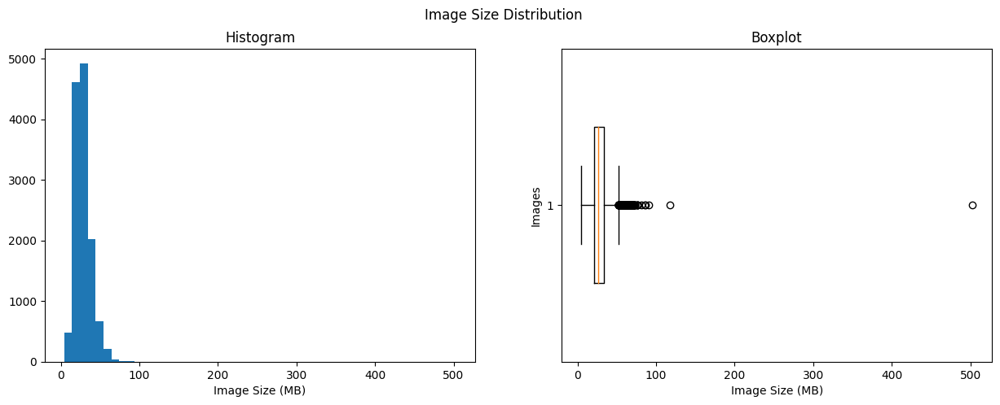

In [ ]:
# Plot image size distribution
fig, ax = plt.subplots(1, 2, figsize=(15,5))
fig.suptitle('Image Size Distribution')
ax[0].hist(img_size, bins=50)
ax[0].set_title('Histogram')
ax[0].set_xlabel('Image Size (MB)')
ax[1].boxplot(img_size, vert=False, widths=0.5)
ax[1].set_title('Boxplot')
ax[1].set_xlabel('Image Size (MB)')
ax[1].set_ylabel('Images')
plt.show()

#2.5 Preprocess

##2.5.1 Rescaling and saving images

We process all input images and resize them to 128x128 RGB images. We only need to do this once.

In [ ]:
# Ensuring the directory for the resized images exists
!mkdir -p images/resized

In [ ]:
# Resize each image and save, convert to numpy

img_arr = np.zeros((df.shape[0],128*128*3)) # initialize np.array

for i, f in enumerate(tqdm(df.ImageID)):
    img = Image.open(images_path + f + '.jpg')
    img_resized = img.resize((128,128))
    img_resized.save("images/resized/"+f+'.jpg', "JPEG", optimize=True)
    img_arr[i] = np.asarray(img_resized, dtype=np.uint8).flatten()

In [ ]:
# Encode labels
df['Label'] = (df.LabelName == 'dog').astype(np.uint8)

In [ ]:
# Ensuring the directory for the data exists
!mkdir -p data

In [ ]:
# Saving the image data, labels, and bounding box data
np.save(colab_path+'data/img.npy', img_arr.astype(np.uint8))
np.save(colab_path+'data/y_label.npy', df.Label.values)
np.save(colab_path+'data/y_bbox.npy', df[['XMin', 'YMin', 'XMax', 'YMax']].values.astype(np.float32))

##2.5.2 Loading Bounding box data

Since we have used several different environments, each one uses and supports a different method of loading the previously saved data.

In [ ]:
# This code loads data on a default Google Colab:
# path = '/content/drive/MyDrive/aml/aml'         # Change the first "aml" directory to match the directory in your own Google Drive
# X = np.load(colab_path + '/img.npy', allow_pickle=True)
# y_label = np.load(colab_path + '/y_label.npy', allow_pickle=True)
# y_bbox = np.load(colab_path + '/y_bbox.npy', allow_pickle=True)


# This code loads data on a custom GCE VM
# Since the Google Colab image in Custom GCE VM image does not support loading data from Google Drive, input and label data (the 3 files) need to be manually uploaded into the Custom GCE VM. After that, we can load it into memory:
X = np.load('/content/img.npy', allow_pickle=True)
y_label = np.load('/content/y_label.npy', allow_pickle=True)
y_bbox = np.load('/content/y_bbox.npy', allow_pickle=True)


# This code loads data into our local Jupyter notebook:
# X = np.load('data/img.npy', allow_pickle=True)
# y_label = np.load('data/y_label.npy', allow_pickle=True)
# y_bbox = np.load('data/y_bbox.npy', allow_pickle=True)

In [ ]:
# Encoding the target labels
idx_to_label = {1:'dog', 0:'cat'}

##2.5.3 Verify Data Loaded Correctly
Code below will show 6 random images

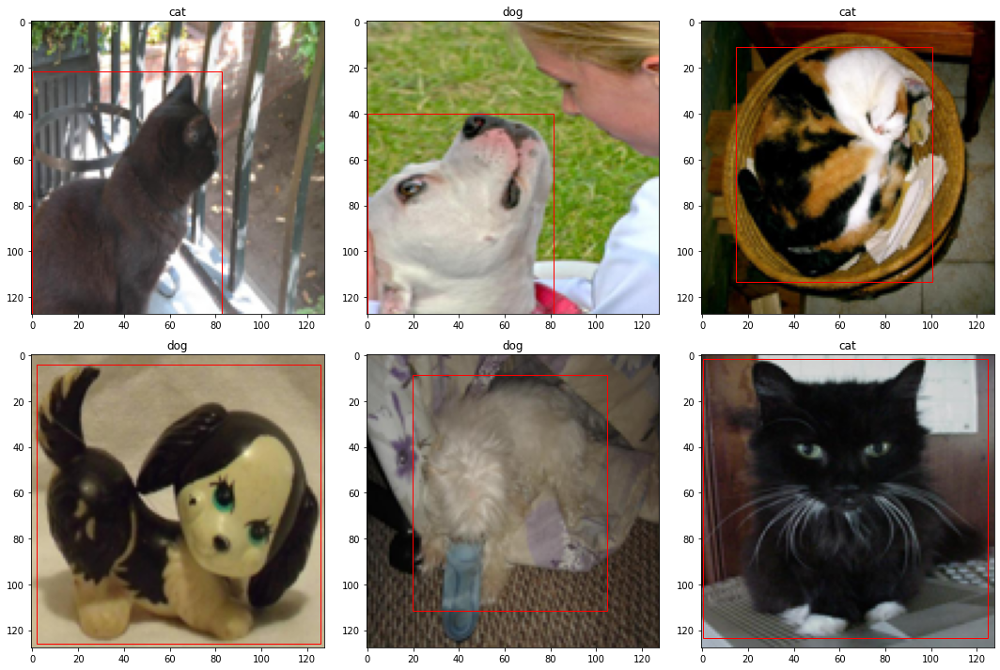

In [ ]:
# Plot random 6 resized images to verify the data was loaded correctly
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(X.shape[0], size=6, replace=False)):
    coords = y_bbox[j] * 128
    ax[i].imshow(X[j].reshape(128,128,3))
    ax[i].set_title(idx_to_label[y_label[j]])
    ax[i].add_patch(plt.Rectangle((coords[0], coords[1]), 
                                  coords[2]-coords[0], coords[3]-coords[1], 
                                  edgecolor='red', facecolor='none'))

plt.tight_layout()
plt.show()

##2.5.4 Data Augmentation using Imgaug library
The following data augmentation techniques were created using "imgaug".

Source: https://towardsdatascience.com/data-augmentation-techniques-in-python-f216ef5eed69 

Since this is a cat and dog detection task and we are working with relatively inefficient classifiers, we decided to implement several data augmentation techniques as well as the Skimage HOG (Histogram of Oriented Gradients) to extract important features out of our training set.


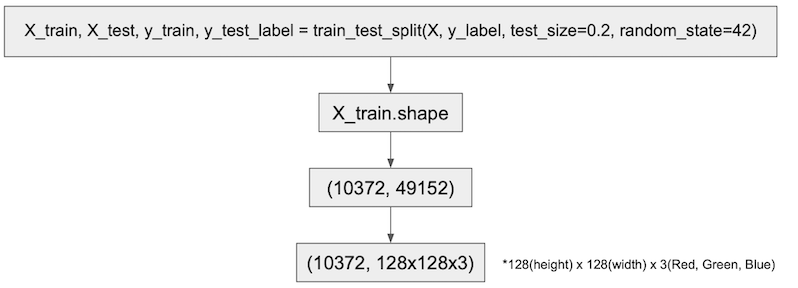

###2.5.4.1 Reshape

We reshape from 49152(1D) to 128x128x3(3D) to apply Data Augmentation and HOG Transformer to our training set. This is because HOG Transformer requires two spatial dimensional data (spatial dimensions: height, width, or length), by doing this we assign two dimensions of 128 pixels and 3 colors (Red, Green, and Blue).

In [ ]:
'''
X_train.reshape((-1, 128, 128, 3)), reshape X_train from 1D(49152) to 3D(128x128x3)
'''
experiment = X_train.reshape((-1, 128, 128, 3)) 
experiment.shape

(11552, 128, 128, 3)

###2.5.4.2 Rotation

In [ ]:
'''
Custom rotation function to rotate images using "imgaug" data augmentation library
https://towardsdatascience.com/data-augmentation-techniques-in-python-f216ef5eed69
'''

def rotate_images(data):
    # Create the rotation augmentation object
    rotate = iaa.Affine(rotate=(-50, 30))
    
    # Apply the rotation augmentation to each image in the array
    rotated_images = np.array([rotate.augment_image(x) for x in data])
    
    return rotated_images

In [ ]:
'''
Custom function to plot 2 random images for experimental purposes
'''

def rotate_images(data):
    # Create the rotation augmentation object
    rotate = iaa.Affine(rotate=(-50, 30))
    
    # Apply the rotation augmentation to each image in the array
    rotated_images = np.array([rotate.augment_image(x) for x in data])
    
    # Plot 2 random images
    fig, ax = plt.subplots(1, 2, figsize=(8, 8))
    for i in range(2):
        rand_idx = np.random.randint(rotated_images.shape[0])
        ax[i].imshow(rotated_images[rand_idx])
    
    plt.show()

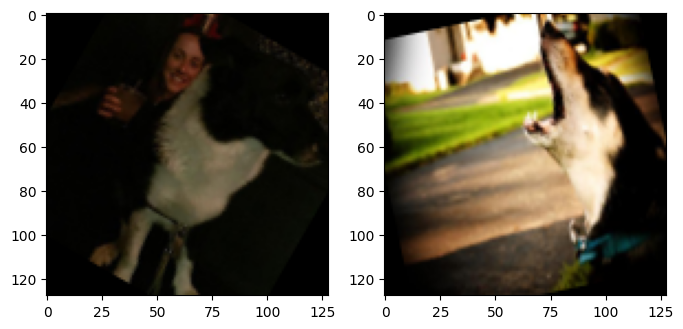

In [ ]:
rotate_images(experiment)

###2.5.4.3 Crop Images

In [ ]:
'''
Custom function to crop using "imgaug" data augmentation library
https://towardsdatascience.com/data-augmentation-techniques-in-python-f216ef5eed69
'''

def crop_images(data):
    crop = iaa.Crop(percent=(0, 0.2))
    X_crop = crop.augment_images(data)
    return X_crop

In [ ]:
'''
Custom function to plot 2 random images for experimental purposes
'''

def crop_images(data):
    crop = iaa.Crop(percent=(0, 0.2))
    X_crop = crop.augment_images(data)
    
    # plot 2 random images
    fig, axes = plt.subplots(1, 2, figsize=(8, 8))
    for i in range(2):
        rand_idx = np.random.randint(data.shape[0])
        image = X_crop[rand_idx]
        axes[i].imshow(image)
        axes[i].axis('off')
    plt.show()

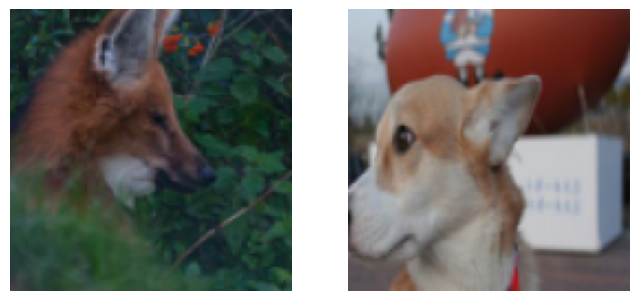

In [ ]:
crop_images(experiment)

###2.5.4.4 Flip Images Horizontally and Vertically

In [ ]:
'''
Custom function to flip images horizontally using "imgaug" data augmentation library
https://towardsdatascience.com/data-augmentation-techniques-in-python-f216ef5eed69
'''

def flip_images_horizontally(data):
    flip_hr = iaa.Fliplr(p=1.0)
    X_flipped = np.zeros(data.shape, dtype=np.uint8)
    for i in range(data.shape[0]):
        X_flipped[i] = flip_hr.augment_image(data[i])
    return X_flipped

In [ ]:
'''
Custom function to plot 2 random images for experimental purposes
'''

def flip_images_horizontally(data):
    flip_hr = iaa.Fliplr(p=1.0)
    X_train_flipped = np.zeros(data.shape, dtype=np.uint8)
    fig, axes = plt.subplots(1, 2, figsize=(8, 8))
    for i in range(2):
        rand_idx = np.random.randint(data.shape[0])
        image = data[rand_idx]
        flipped_image = flip_hr.augment_image(image)
        X_train_flipped[rand_idx] = flipped_image
        axes[i].imshow(flipped_image)
        axes[i].axis('off')
    plt.show()

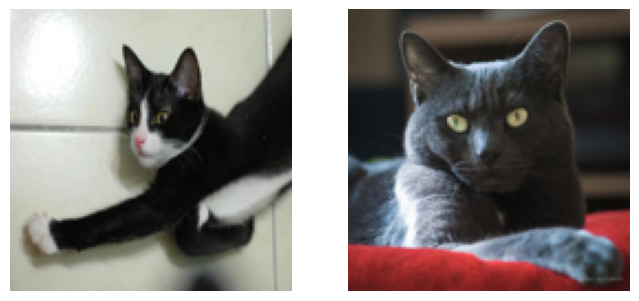

In [ ]:
flip_images_horizontally(experiment)

In [ ]:
'''
Function to flip images vertically using "imgaug" data augmentation library
https://towardsdatascience.com/data-augmentation-techniques-in-python-f216ef5eed69
'''

def flip_images_vr(data):
    flip_vr = iaa.Flipud(p=1.0)
    X_flipped = []
    for image in data:
        flipped_image = flip_vr.augment_image(image)
        X_flipped.append(flipped_image)
    return np.array(X_flipped)

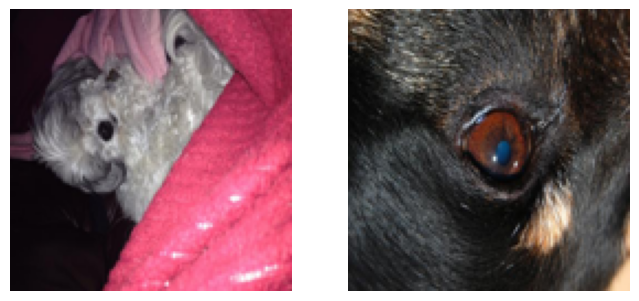

In [ ]:
'''
Custom function to plot 2 random images for experimental purposes
'''

def flip_images_vr(data):
    flip_vr = iaa.Flipud(p=1.0)
    X_flipped = []
    for i in range(data.shape[0]):
        image = data[i]
        flipped_image = flip_vr.augment_image(image)
        X_flipped.append(flipped_image)
    return np.array(X_flipped)

X_train_flip_vr = flip_images_vr(experiment)

# Plotting 2 random images
fig, ax = plt.subplots(1, 2, figsize=(8, 8))
for i in range(2):
    index = np.random.randint(0, X_train_flip_vr.shape[0])
    ax[i].imshow(X_train_flip_vr[index])
    ax[i].axis('off')
plt.show()

###2.5.5.5 Gamma Contrast

In [ ]:
'''
Function to apply gamma contrast on images using "imgaug" data augmentation library
https://towardsdatascience.com/data-augmentation-techniques-in-python-f216ef5eed69
'''

def gamma_contrast(data):
    # Create gamma contrast augmentation object
    contrast = iaa.GammaContrast(gamma=0.8)
    
    # Apply gamma contrast to each image in array
    X_contrast = np.array([contrast.augment_image(x) for x in data])
    
    return X_contrast

In [ ]:
'''
Custom function to plot 2 random images for experimental purposes
'''

def gamma_contrast(data):
    # Create gamma contrast augmentation object
    contrast = iaa.GammaContrast(gamma=0.8)
    
    # Apply gamma contrast to each image in array
    X_contrast = np.array([contrast.augment_image(x) for x in data])
    
    # Plot 2 random images
    fig, axes = plt.subplots(1, 2, figsize=(8, 8))
    for i in range(2):
        rand_idx = np.random.randint(data.shape[0])
        image = X_contrast[rand_idx]
        axes[i].imshow(image)
        axes[i].axis('off')
    plt.show()

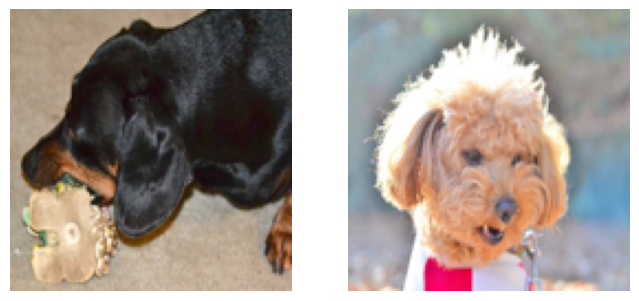

In [ ]:
gamma_contrast(experiment)

##2.5.5 Data Augmentation Transformer

It is important to state that we are using rescaled images before applying data augmentation. The Data Augmentation Transformer includes 6 functions for rotation, cropping, flipping horizontally and vertically, and adjusting gamma contrast (brighter or darker). The idea behind data augmentation is to randomly perform transformations and create variations out of the array of images. This technique is useful for extracting information out of the new variants as well as preventing cases of overfitting.

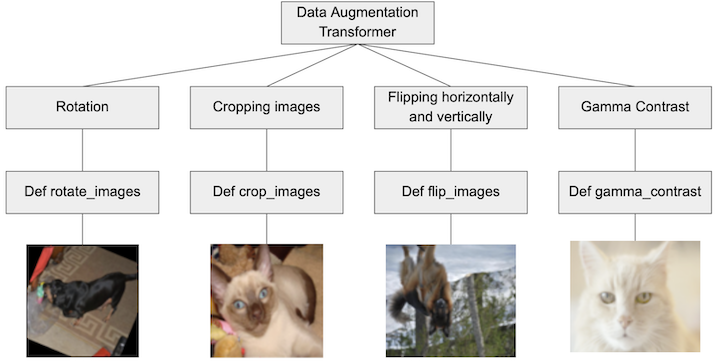


In [ ]:
class DataAugmentation(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        X_rotated = self.rotate_images(X)
        X_cropped = self.crop_images(X_rotated)
        X_flipped_hr = self.flip_images_horizontally(X_cropped)
        X_flipped_vr = self.flip_images_vr(X_flipped_hr)
        X_processed = self.gamma_contrast(X_flipped_vr)
        return X_processed
    
    def rotate_images(self, data):
        rotate = iaa.Affine(rotate=(-50, 30))
        rotated_images = np.array([rotate.augment_image(x) for x in data])
        return rotated_images


    def crop_images(self, data):
        crop = iaa.Crop(percent=(0, 0.2))
        X_crop = crop.augment_images(data)
        return X_crop


    def flip_images_horizontally(self, data):
        flip_hr = iaa.Fliplr(p=1.0)
        X_flipped = np.zeros(data.shape, dtype=np.uint8)
        for i in range(data.shape[0]):
            X_flipped[i] = flip_hr.augment_image(data[i])
        return X_flipped


    def flip_images_vr(self, data):
        flip_vr = iaa.Flipud(p=1.0)
        X_flipped = []
        for image in data:
            flipped_image = flip_vr.augment_image(image)
            X_flipped.append(flipped_image)
        return np.array(X_flipped)


    def gamma_contrast(self, data):
        contrast = iaa.GammaContrast(gamma=0.6)
        X_contrast = np.array([contrast.augment_image(x) for x in data])
        return X_contrast

#2.6 Feature Engineering
Histogram of Oriented Gradients (HOG) Function

An RGB image is a true color image stored as an m-by-n-by-3 data array that defines red, green, and blue color components for each individual pixel. Our HOG Transformer will take these RGB true color images and convert them to grayscale to extract features from them. HOG requires grayscale images because these types of images lower the computational complexity of the analysis. After preprocessing the images, the transformer will calculate the gradient and magnitude for every pixel in the image (small change in the x and y directions). This technique can be used for object detection, classification, and computer vision tasks, because it enhances the texture and shape of the wanted object.

Skimage HOG consists of the following parameters:
-         Orientations: number of buckets we want to create.
-         Pixels per cell: defines the size of the cell for which we create the histogram.
-        Cells per block: size of the block over which we normalize the histogram.
We tried to experiment with many parameters to get the best results, however increasing parameters like orientations can increase the computational complexity and resources of the machine in use. We conducted a Grid Search analysis using many HOG parameters to choose the best number for our HOG Transformer.


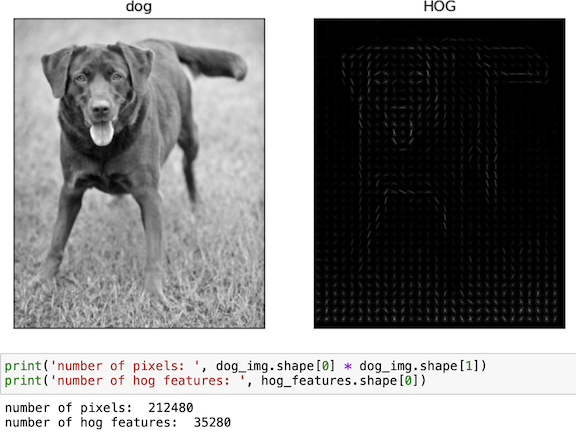

In [ ]:
'''
We will have to brute force the hog computation in our X_train/X_test arrays using a for loop.
Looping over every "image" within data.
Hog image -> https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html
Hog -> https://towardsdatascience.com/hog-histogram-of-oriented-gradients-67ecd887675f
HOG tutorial sickit-learn -> https://kapernikov.com/tutorial-image-classification-with-scikit-learn/

At the end we will convert hog_features list into np.array.
'''
# visualize = False if the input images are grayscale
# visualize = True if input images are RGB

# 16x16 pexels per cell  -> common HOG pxel per cell inputs
# Hog uses L2 normalization by default.

def hog_features(data):
    hog_features = [] # Lets create an empty list to store our extracted hog features
    for image in data:
        gray_image = rgb2gray(image) #gray scale
        fd = hog(gray_image, orientations=8, pixels_per_cell=(4, 4), #hog
                 cells_per_block=(1, 1), visualize=False, multichannel=False)
        hog_features.append(fd) 
        
    hog_features = np.array(hog_features) #from list to array
    return hog_features

In [ ]:
f = hog_features(experiment)

**HOG Example:** The following image shows how we applied HOG function to our X_train set. It is important to state that the variable named "experimental" was created to test the function on X_train array of images. It also shows how it helped us reduce the number of input features in order to test machine learning algorithms for best results.


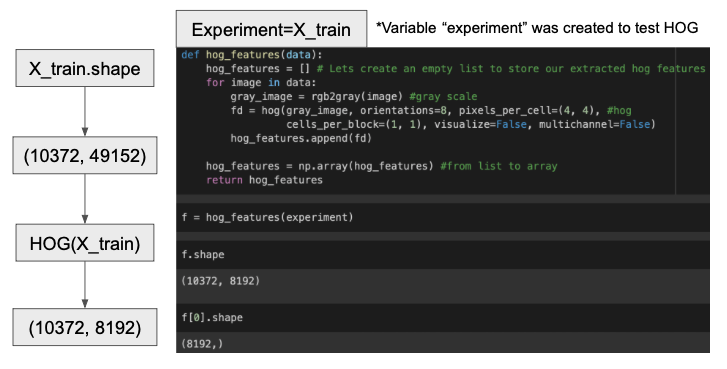




##2.6.1 Reshape and HOG Transformers

In [ ]:
'''
We reshape Train sets from (x, 49152) to (x, 128x128,3) so we can apply HOG Transformer in each of the images 
of X_train.
'''
# Reshape Transformer 
class ReshapeTransformer(BaseEstimator, TransformerMixin):
    
    def __init__(self, shape):
        self.shape = shape
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        return X.reshape((-1,) + self.shape)
    
       
'''
We need to reshape the test set data in the same way as the training set data before applying HOG Transformer. 
HOG expects the input data to have a specific shape. If test data has different shape than the training set,
we will encounter errors".

We will have to brute force the HOG computation in our X_train/X_test arrays using a for loop.
Looping over every "image" within data.
Hog image -> https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html
Hog -> https://towardsdatascience.com/hog-histogram-of-oriented-gradients-67ecd887675f
HOG tutorial sickit-learn -> https://kapernikov.com/tutorial-image-classification-with-scikit-learn/

At the end we will convert hog_features list into np.array.
'''   
# Hog Transformer with skimage rgb2gray()
# visualize = False if the input images are grayscale
# visualize = True if input images are RGB
# 16x16 pexels per cell  -> common HOG pxel per cell inputs
# cells per block -> 2,2 common numbers
# Hog uses L2 normalization by default.

# orientations=9, pixels_per_cell=(14, 14), cells_per_block=(2, 2)

class HogTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, orientations=8, pixels_per_cell=(4, 4), cells_per_block=(1, 1)):
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X):
        hog_features = []
        for image in X:
            gray_image = rgb2gray(image)
            fd = hog(gray_image, orientations=self.orientations, pixels_per_cell=self.pixels_per_cell,
                     cells_per_block=self.cells_per_block, visualize=False, multichannel=False)
            hog_features.append(fd)
            
        hog_features = np.array(hog_features)
        return hog_features

#2.7 Preprocessing Pipeline

In [ ]:
set_config(display="diagram")

preprocessing_pipe = Pipeline([
                ('reshape_transformer', ReshapeTransformer((128, 128, 3))),# instance dimensions
                ('data_augmentation', DataAugmentation())
                ])
display(preprocessing_pipe)

Pipeline(steps=[('reshape_transformer',
                 ReshapeTransformer(shape=(128, 128, 3))),
                ('data_augmentation', DataAugmentation())])

#2.8 Baseline Classification Pipeline

Splitting the data for classification into 80% for training and 20% for testing.
Since we are using GridSearchCV, we decided not to use validation data sets.

In [ ]:
X_train, X_test, y_train, y_test_label = train_test_split(X, y_label, test_size=0.2, random_state=42)

In [ ]:
expClassLog = pd.DataFrame(columns=["Model",
                               "Train Accuracy", 
                               "Test Accuracy",
                               "CXE",
                               "F1 Score Test",
                               "Precision Test",
                               "Fit Time",
                               "Score Time",
                               "Description"
                              ])

This baseline classifier consists of preprocessing pipeline, HOG transformer, Standard Scaler, and “clf” instance.
* “clf” = None (grid search will take on the best estimator)
Best estimator:
-	Logistic Regression (l1 and l2 penalties)
-	 SGDClassifier 
-	SVC Classifier
Hyperparameter tunning (GridSearchCV) contains the baseline classifier pipeline, estimators as parameters, 5 cross fold validations, and “accuracy” as scoring.


In [ ]:
baseline_class_pipe = Pipeline([
            ('preprocessing', preprocessing_pipe),
            ('hog_transformer', HogTransformer(orientations=8)),
            ('scaler', StandardScaler()),
            ('clf', None)
    ])

estimators = [{'clf': [LogisticRegression(penalty='l2', solver='saga')]},
              {'clf': [LogisticRegression(penalty='l1', solver='saga')]},
              {'clf': [SGDClassifier()]},
              {'clf': [SVC(probability=True)]}]


# Fitting 5 folds for each of 4 candidates, totalling 20 fits
baseline_class_gridsearch = GridSearchCV(baseline_class_pipe, param_grid=estimators, cv=5, scoring='accuracy', n_jobs=-1)

In [ ]:
baseline_class_pipe # run this cell to get the  pipeline diagram

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('reshape_transformer',
                                  ReshapeTransformer(shape=(128, 128, 3))),
                                 ('data_augmentation', DataAugmentation())])),
                ('hog_transformer', HogTransformer()),
                ('scaler', StandardScaler()), ('clf', None)])

In [ ]:
t0 = time()
baseline_class_gridsearch.fit(X_train, y_train)
print()
print()
print("Training finished in %0.3fs" % (time() - t0))
print()



Training finished in 7936.761s



We can see that SVC Classifier was grid search best parameter. The idea here is to print out or evaluation metrics like confusion matrix and classification report, which will show other metrics like precision and F-1 Score as well recall and support.

In [ ]:
baseline_class_gridsearch.best_params_

{'clf': SVC(probability=True)}

In [ ]:
results_df = pd.DataFrame(baseline_class_gridsearch.cv_results_)
display(results_df)

class_pipeline = baseline_class_gridsearch.best_estimator_

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_clf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,527.427615,6.181090,87.579370,4.521324,LogisticRegression(solver='saga'),{'clf': LogisticRegression(solver='saga')},0.553253,0.544578,0.548216,0.522662,0.519286,0.537599,0.013892,4
1,658.066367,6.646280,95.080816,6.676229,"LogisticRegression(penalty='l1', solver='saga')","{'clf': LogisticRegression(penalty='l1', solve...",0.537349,0.533012,0.549180,0.545323,0.534716,0.539916,0.006267,3
2,403.338270,6.651246,90.284476,6.941409,SGDClassifier(),{'clf': SGDClassifier()},0.551807,0.524819,0.541948,0.535680,0.564609,0.543773,0.013615,2
3,2865.416176,175.877367,196.629341,11.860193,SVC(probability=True),{'clf': SVC(probability=True)},0.617831,0.615422,0.605111,0.604147,0.600289,0.608560,0.006824,1


In [ ]:
y_pred = class_pipeline.predict(X_test)

In [ ]:
y_train_pred = class_pipeline.predict(X_train)

In [ ]:
results_df['mean_fit_time'].loc[results_df['param_clf'] == 'SVC(probability=True)']

In [ ]:
exp_name = f"Baseline Classification Model"
expClassLog.loc[0,:9] = [f"{exp_name}"] + list(
    [np.round(accuracy_score(y_train, y_train_pred), 3), 
    np.round(accuracy_score(y_test_label, y_pred), 3),
    'NA',
    np.round(f1_score(y_test_label, y_pred, average='weighted'), 3),
    np.round(precision_score(y_test_label, y_pred), 3),
    np.round(2865.416176, 2),
    np.round(196.629341, 2),
    baseline_class_gridsearch.best_params_]
    )

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:719: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  indexer = self._get_setitem_indexer(key)


In [ ]:
expClassLog

,Model,Train Accuracy,Test Accuracy,CXE,F1 Score Test,Precision Test,Fit Time,Score Time,Description
0,Baseline Classification Model,0.608,0.594,NA,0.592,0.61,2865.42,196.63,{'clf': SVC(probability=True)}


In [ ]:
print(classification_report(y_test_label, y_pred, target_names=['cat', 'dog']))

              precision    recall  f1-score   support

         cat       0.57      0.51      0.54      1209
         dog       0.61      0.67      0.64      1385

    accuracy                           0.59      2594
   macro avg       0.59      0.59      0.59      2594
weighted avg       0.59      0.59      0.59      2594



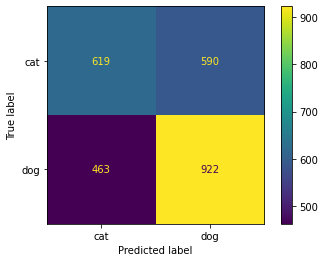

In [ ]:
cm = confusion_matrix(y_test_label, y_pred)
class_names = ['cat', 'dog']
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot()
plt.show()

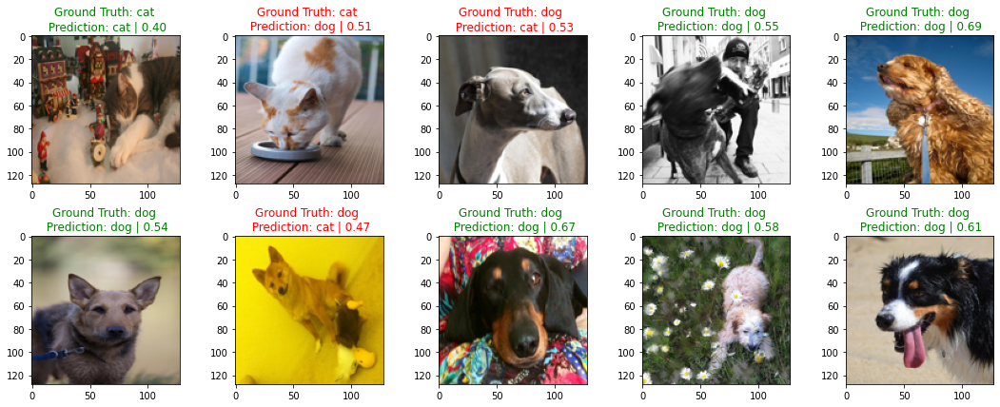

In [ ]:
y_pred_label = y_pred
y_pred_label_proba = class_pipeline.predict_proba(X_test)

fig, ax = plt.subplots(nrows=2, ncols=5, sharex=False, sharey=False,figsize=(15,6))
ax = ax.flatten()

for i in range(10):
    img = X_test[i].reshape(128,128,3)
    ax[i].imshow(img)
    ax[i].set_title("Ground Truth: {0} \n Prediction: {1} | {2:.2f}".format(idx_to_label[y_test_label[i]],
                                                                   idx_to_label[y_pred_label[i]],
                                                                   y_pred_label_proba[i][y_pred_label[i]]),
                   color=("green" if y_pred_label[i]==y_test_label[i] else "red"))

plt.tight_layout()
plt.show()

#2.9 Logistic Classification Pipeline

The logistic regression model takes on the same approach as the previous classifier. Its pipeline consists of preprocessing pipeline, HOG Transformer, Standard Scaler, and the logistic regression model using solver Saga.
Solver Saga is the only solver to take on 4 penalties described in params (“None”, “L1”, “L2”, and “Elasticnet”).


In [ ]:
lr_pipe = Pipeline([
            ('preprocessing', preprocessing_pipe),
            ('hog_transformer', HogTransformer(orientations=8)),
            ('scaler', StandardScaler()),
            ('lr', LogisticRegression(solver='saga')) # solver saga is used for L1,L2, and Elasticnet
                                                                    # solver saga only solver to support all 4 penalties.
    ])

params = {'lr__C':[1.0, 10.0, 100.0, 1000.0], 
          'lr__penalty':['None','l1', 'l2', 'Elasticnet']}

# Fitting 5 folds for each of 16 candidates, totalling 80 fits
lr_gridsearch = GridSearchCV(lr_pipe, param_grid=params, cv=5, scoring='accuracy', n_jobs=-1)

In [ ]:
lr_pipe # run this cell to get the  pipeline diagram

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('reshape_transformer',
                                  ReshapeTransformer(shape=(128, 128, 3))),
                                 ('data_augmentation', DataAugmentation())])),
                ('hog_transformer', HogTransformer()),
                ('scaler', StandardScaler()),
                ('lr', LogisticRegression(solver='saga'))])

In [ ]:
t0 = time()
lr_gridsearch.fit(X_train, y_train)
print()
print()
print("Training finished in %0.3fs" % (time() - t0))
print()

/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py:350: FitFailedWarning: 
40 fits failed out of a total of 80.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.8/dist-packages/sklearn/pipeline.py", line 394, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  Fil



Training finished in 5864.763s



/usr/local/lib/python3.8/dist-packages/sklearn/linear_model/_sag.py:89: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  def sag_solver(


In the case of logistic regression hyperparameter tunning grid search performs 5 cross fold validations, considers the previous 4 penalties and C (inverse of regularization strength) range from 1 to 1000. Also, it uses accuracy as scoring.
We can see that C = 1000 and penalty “L1” were grid search best parameters. Classification report and confusion matrix are also printed for this classifier. CXE metric is included within the evaluation metrics.


In [ ]:
lr_gridsearch.best_params_

{'lr__C': 1000.0, 'lr__penalty': 'l1'}

In [ ]:
results_df = pd.DataFrame(lr_gridsearch.cv_results_)
display(results_df)

class_pipeline = lr_gridsearch.best_estimator_

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_lr__C,param_lr__penalty,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,403.920041,2.551892,0.000000,0.000000,1.0,None,"{'lr__C': 1.0, 'lr__penalty': 'None'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,9
1,641.804314,26.377547,99.892420,1.334820,1.0,l1,"{'lr__C': 1.0, 'lr__penalty': 'l1'}",0.554217,0.537349,0.554002,0.527001,0.540019,0.542518,0.010416,2
2,493.492039,8.037257,96.181373,4.930972,1.0,l2,"{'lr__C': 1.0, 'lr__penalty': 'l2'}",0.537349,0.542169,0.534233,0.536644,0.556895,0.541458,0.008137,3
3,389.665884,5.573412,0.000000,0.000000,1.0,Elasticnet,"{'lr__C': 1.0, 'lr__penalty': 'Elasticnet'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,10
4,401.536379,8.924188,0.000000,0.000000,10.0,None,"{'lr__C': 10.0, 'lr__penalty': 'None'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,11
5,637.959462,8.105673,89.756873,7.042646,10.0,l1,"{'lr__C': 10.0, 'lr__penalty': 'l1'}",0.543133,0.550361,0.540501,0.533269,0.537126,0.540878,0.005782,4
6,491.267119,14.491922,99.533183,4.072574,10.0,l2,"{'lr__C': 10.0, 'lr__penalty': 'l2'}",0.552289,0.526747,0.542912,0.519769,0.536644,0.535672,0.011507,6
7,393.991035,11.360220,0.000000,0.000000,10.0,Elasticnet,"{'lr__C': 10.0, 'lr__penalty': 'Elasticnet'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,12
8,398.805064,4.760082,0.000000,0.000000,100.0,None,"{'lr__C': 100.0, 'lr__penalty': 'None'}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,13
9,636.518985,13.800068,92.776899,3.145236,100.0,l1,"{'lr__C': 100.0, 'lr__penalty': 'l1'}",0.540723,0.534458,0.533269,0.531340,0.537608,0.535480,0.003319,7


In [ ]:
y_pred = class_pipeline.predict(X_test)
y_train_pred = class_pipeline.predict(X_train)

In [ ]:
cxe = log_loss(y_test_label, y_pred)

In [ ]:
exp_name = f"Logistic Classification Model"
expClassLog.loc[1,:9] = [f"{exp_name}"] + list(
    [np.round(accuracy_score(y_train, y_train_pred), 3), 
    np.round(accuracy_score(y_test_label, y_pred), 3),
    cxe,
    np.round(f1_score(y_test_label, y_pred, average='weighted'), 3),
    np.round(precision_score(y_test_label, y_pred), 3),
    np.round(633.433864, 2),
    np.round(89.332190, 2),
    lr_gridsearch.best_params_]
    )

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:713: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  def __setitem__(self, key, value):


In [ ]:
expClassLog

,Model,Train Accuracy,Test Accuracy,CXE,F1 Score Test,Precision Test,Fit Time,Score Time,Description
0,Baseline Classification Model,0.608,0.594,NA,0.592,0.61,2865.42,196.63,{'clf': SVC(probability=True)}
1,Logistic Classification Model,0.541,0.54,15.871506,0.541,0.571,633.43,89.33,"{'lr__C': 1000.0, 'lr__penalty': 'l1'}"


In [ ]:
print(classification_report(y_test_label, y_pred, target_names=['cat', 'dog']))

              precision    recall  f1-score   support

         cat       0.51      0.52      0.51      1209
         dog       0.57      0.56      0.57      1385

    accuracy                           0.54      2594
   macro avg       0.54      0.54      0.54      2594
weighted avg       0.54      0.54      0.54      2594



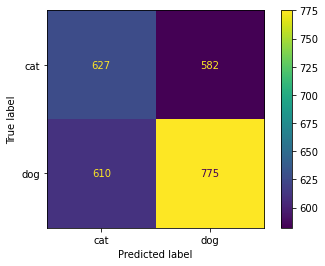

In [ ]:
cm = confusion_matrix(y_test_label, y_pred)
class_names = ['cat', 'dog']
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot()
plt.show()

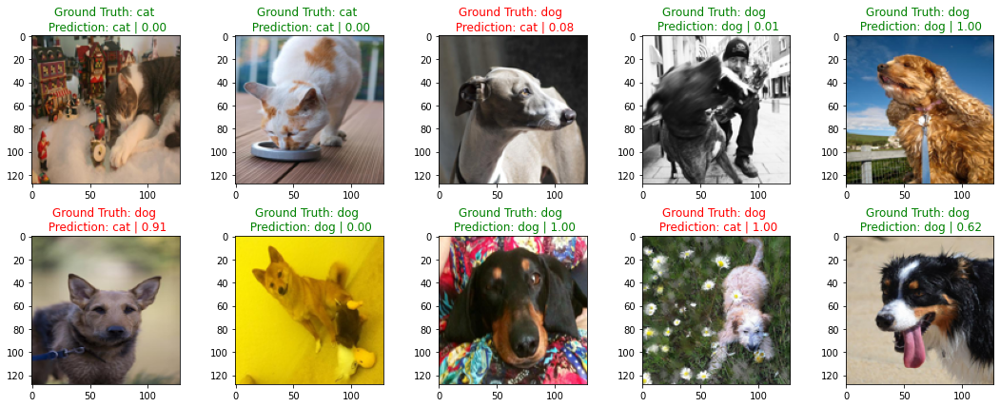

In [ ]:
y_pred_label = y_pred
y_pred_label_proba = class_pipeline.predict_proba(X_test)

fig, ax = plt.subplots(nrows=2, ncols=5, sharex=False, sharey=False,figsize=(15,6))
ax = ax.flatten()

for i in range(10):
    img = X_test[i].reshape(128,128,3)
    ax[i].imshow(img)
    ax[i].set_title("Ground Truth: {0} \n Prediction: {1} | {2:.2f}".format(idx_to_label[y_test_label[i]],
                                                                   idx_to_label[y_pred_label[i]],
                                                                   y_pred_label_proba[i][y_pred_label[i]]),
                   color=("green" if y_pred_label[i]==y_test_label[i] else "red"))

plt.tight_layout()
plt.show()

#2.10 SVC Classification Pipeline

The C-Support Vector Classification model takes on the same approach as the previous classifiers. Its pipeline consists of preprocessing pipeline, HOG Transformer, Standard Scaler, and the SVC model.
GridSearch was used to perform the hyperparameter tuning and from different regularization parameters C (increments between 0.1 to 100) and with 4 different kernel types, the best accuracy was achieved with C = 0.1 and kernel type “rbf”.


In [ ]:
svc_pipe = Pipeline([
            ('preprocessing', preprocessing_pipe),
            ('hog_transformer', HogTransformer(orientations=8)),
            ('scaler', StandardScaler()),
            ('svc', SVC(max_iter=100))
    ])

params = {
    'svc__C': (0.1, 1, 10, 100),
    'svc__kernel': ('rbf', 'linear', 'sigmoid', 'poly'),
    # 'svc__degree': (1, 3),
    # 'svc__tol': (0.00001, 0.0001),
    }

# Fitting 5 folds for each of 16 candidates, totalling 80 fits
svc_gridsearch = GridSearchCV(svc_pipe, param_grid=params, cv=5, scoring='accuracy', n_jobs=-1)

In [ ]:
svc_pipe # run this cell to get the pipeline diagram

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('reshape_transformer',
                                  ReshapeTransformer(shape=(128, 128, 3))),
                                 ('data_augmentation', DataAugmentation())])),
                ('hog_transformer', HogTransformer()),
                ('scaler', StandardScaler()), ('svc', SVC(max_iter=100))])

In [ ]:
t0 = time()
svc_gridsearch.fit(X_train, y_train)
print()
print()
print("Training finished in %0.3fs" % (time() - t0))
print()



Training finished in 5599.036s



/usr/local/lib/python3.8/dist-packages/sklearn/svm/_base.py:281: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  def _warn_from_fit_status(self):


In [ ]:
svc_gridsearch.best_params_

{'svc__C': 0.1, 'svc__kernel': 'rbf'}

In [ ]:
results_df = pd.DataFrame(svc_gridsearch.cv_results_)
display(results_df)

class_pipeline = svc_gridsearch.best_estimator_

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_svc__C,param_svc__kernel,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,422.140012,3.517826,104.992853,0.835538,0.1,rbf,"{'svc__C': 0.1, 'svc__kernel': 'rbf'}",0.546024,0.526265,0.542912,0.543394,0.529412,0.537602,0.008103,1
1,420.314378,3.122642,102.764388,1.034633,0.1,linear,"{'svc__C': 0.1, 'svc__kernel': 'linear'}",0.526265,0.512289,0.516393,0.518804,0.526037,0.519958,0.005470,8
2,419.582228,2.843544,103.171217,1.601057,0.1,sigmoid,"{'svc__C': 0.1, 'svc__kernel': 'sigmoid'}",0.532048,0.530120,0.521697,0.522662,0.514465,0.524198,0.006325,7
3,415.064698,4.406666,102.611169,0.385493,0.1,poly,"{'svc__C': 0.1, 'svc__kernel': 'poly'}",0.527229,0.526265,0.530376,0.527965,0.527001,0.527767,0.001413,3
4,419.286224,3.530059,104.540118,0.957962,1,rbf,"{'svc__C': 1, 'svc__kernel': 'rbf'}",0.530602,0.522410,0.532305,0.535680,0.537608,0.531721,0.005266,2
5,415.003509,2.329483,102.595424,1.045627,1,linear,"{'svc__C': 1, 'svc__kernel': 'linear'}",0.516145,0.520964,0.484089,0.509643,0.513500,0.508868,0.012925,14
6,413.275085,3.302811,103.130224,0.588215,1,sigmoid,"{'svc__C': 1, 'svc__kernel': 'sigmoid'}",0.516145,0.504578,0.501446,0.514947,0.519769,0.511377,0.007081,13
7,419.058558,2.992447,103.442516,0.788538,1,poly,"{'svc__C': 1, 'svc__kernel': 'poly'}",0.527229,0.527229,0.527483,0.527483,0.527483,0.527381,0.000125,4
8,415.394787,2.694725,104.635193,0.895103,10,rbf,"{'svc__C': 10, 'svc__kernel': 'rbf'}",0.540723,0.509398,0.528930,0.500000,0.514465,0.518703,0.014449,10
9,417.293814,5.365579,102.203640,0.967967,10,linear,"{'svc__C': 10, 'svc__kernel': 'linear'}",0.525783,0.502651,0.524108,0.516876,0.506268,0.515137,0.009289,11


In [ ]:
y_pred = class_pipeline.predict(X_test)
y_train_pred = class_pipeline.predict(X_train)

In [ ]:
exp_name = f"SVC Classification Model"
expClassLog.loc[2,:9] = [f"{exp_name}"] + list(
    [np.round(accuracy_score(y_train, y_train_pred), 3), 
    np.round(accuracy_score(y_test_label, y_pred), 3),
    'NA',
    np.round(f1_score(y_test_label, y_pred, average='weighted'), 3),
    np.round(precision_score(y_test_label, y_pred), 3),
    np.round(422.140012, 2),
    np.round(104.992853, 2),
    svc_gridsearch.best_params_]
    )	

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:719: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  indexer = self._get_setitem_indexer(key)


In [ ]:
expClassLog

,Model,Train Accuracy,Test Accuracy,CXE,F1 Score Test,Precision Test,Fit Time,Score Time,Description
0,Baseline Classification Model,0.608,0.594,NA,0.592,0.61,2865.42,196.63,{'clf': SVC(probability=True)}
1,Logistic Classification Model,0.541,0.54,15.871506,0.541,0.571,633.43,89.33,"{'lr__C': 1000.0, 'lr__penalty': 'l1'}"
2,SVC Classification Model,0.534,0.54,NA,0.524,0.554,422.14,104.99,"{'svc__C': 0.1, 'svc__kernel': 'rbf'}"


In [ ]:
print(classification_report(y_test_label, y_pred, target_names=['cat', 'dog']))

              precision    recall  f1-score   support

         cat       0.51      0.34      0.41      1209
         dog       0.55      0.72      0.62      1385

    accuracy                           0.54      2594
   macro avg       0.53      0.53      0.52      2594
weighted avg       0.53      0.54      0.52      2594



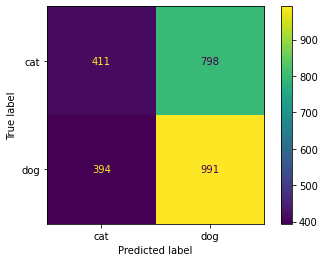

In [ ]:
cm = confusion_matrix(y_test_label, y_pred)
class_names = ['cat', 'dog']
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot()
plt.show()

Since the SVC classifier was run with the default value of probability being "False", predict_proba is not available in this experiment.

In [ ]:
y_pred_label = y_pred
y_pred_label_proba = class_pipeline.predict_proba(X_test)

fig, ax = plt.subplots(nrows=2, ncols=5, sharex=False, sharey=False,figsize=(15,6))
ax = ax.flatten()

for i in range(10):
    img = X_test[i].reshape(128,128,3)
    ax[i].imshow(img)
    ax[i].set_title("Ground Truth: {0} \n Prediction: {1} | {2:.2f}".format(idx_to_label[y_test_label[i]],
                                                                   idx_to_label[y_pred_label[i]],
                                                                   y_pred_label_proba[i][y_pred_label[i]]),
                   color=("green" if y_pred_label[i]==y_test_label[i] else "red"))

plt.tight_layout()
plt.show()

#2.11 SGD Classification Pipeline

The SGD Classifier pipeline consists of the usual preprocessing pipeline, HOG Transformer, Standard Scaler and SGDCLassifier() max iterations of 100. The parameters consist of 3 losses, 4 penalties, and learning rate. GridSearchCV shares the same steps as the other classifiers including 5 cross fold validation and scoring set to “accuracy”.
-        Log loss (logistic)
-        Perceptron
-        Modified huber

It also has 4 penalties:


-        None
-        L1
-        L2
-        Elasticnet
We also had planned on using more parameters for the hyperparameter tuning section, however we had to edit our parameters many times due to the VM RAM resources. Finally, we can see that the GridSearcvCV picks hinge loss for best loss and L1 for best penalty.


In [ ]:
sgd_pipe = Pipeline([
            ('preprocessing', preprocessing_pipe),
            ('hog_transformer', HogTransformer(orientations=8)),
            ('scaler', StandardScaler()),
            ('sgd', SGDClassifier(max_iter=100))
    ])

params = {
    'sgd__loss': ('log_loss', 'perceptron', 'modified_huber'),
    'sgd__penalty': (None, 'l1', 'l2', 'elasticnet'),
    'sgd__learning_rate': ('optimal', 'adaptive'),   #, 'constant'
    # 'sgd__tol': (0.00001, 0.0001),
    }

# Fitting 5 folds for each of 24 candidates, totalling 120 fits
sgd_gridsearch = GridSearchCV(sgd_pipe, param_grid=params, cv=5, scoring='accuracy', n_jobs=-1)

In [ ]:
sgd_pipe # run this cell to get the pipeline diagram

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('reshape_transformer',
                                  ReshapeTransformer(shape=(128, 128, 3))),
                                 ('data_augmentation', DataAugmentation())])),
                ('hog_transformer', HogTransformer()),
                ('scaler', StandardScaler()),
                ('sgd', SGDClassifier(max_iter=100))])

In [ ]:
#%%time
t0 = time()
sgd_gridsearch.fit(X_train, y_train)
print()
print()
print("Training finished in %0.3fs" % (time() - t0))
print()
#Note images we're loaded in from another notebook due to long run time. 

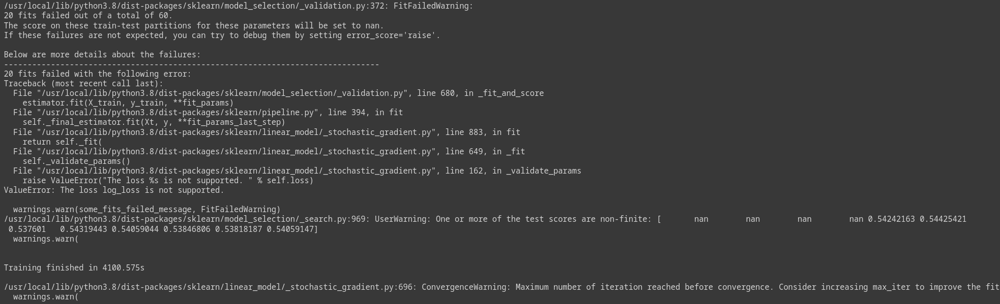

In [ ]:
sgd_gridsearch.best_params_
#Note images we're loaded in from another notebook due to long run time. 

image.png

In [ ]:
results_df = pd.DataFrame(sgd_gridsearch.cv_results_)
display(results_df)

class_pipeline = sgd_gridsearch.best_estimator_
#Note images we're loaded in from another notebook due to long run time. 

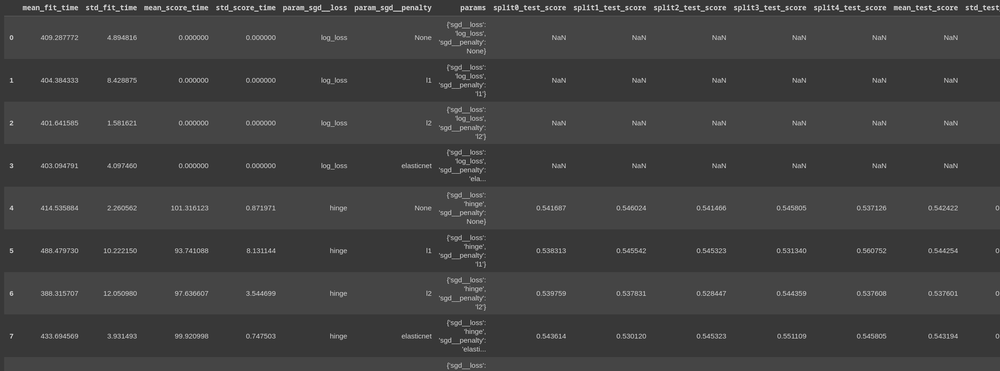

In [ ]:
y_pred = class_pipeline.predict(X_test)
y_train_pred = class_pipeline.predict(X_train)

In [ ]:
exp_name = f"SGD Classification Model"
expClassLog.loc[3,:9] = [f"{exp_name}"] + list(
    [np.round(accuracy_score(y_train, y_train_pred), 3), 
    np.round(accuracy_score(y_test_label, y_pred), 3),
    'NA',
    np.round(f1_score(y_test_label, y_pred, average='weighted'), 3),
    np.round(precision_score(y_test_label, y_pred), 3),
    np.round(, 2),
    np.round(, 2),
    svc_gridsearch.best_params_]
    )	
#Note images we're loaded in from another notebook due to long run time. 

In [ ]:
expClassLog
#Note images we're loaded in from another notebook due to long run time. 

,Model,Train Accuracy,Test Accuracy,CXE,F1 Score Test,Precision Test,Fit Time,Score Time,Description
0,Baseline Classification Model (SVC),0.608,0.594,NA,0.592,0.61,2865.42,196.63,{'clf': SVC(probability=True)}
1,Logistic Classification Model,0.541,0.54,15.871506,0.541,0.571,633.43,89.33,"{'lr__C': 1000.0, 'lr__penalty': 'l1'}"
2,SVC Classification Model,0.534,0.54,NA,0.524,0.554,422.14,104.99,"{'svc__C': 0.1, 'svc__kernel': 'rbf'}"
3,SGD Classification Model,0.536,0.527,NA,0.527,0.559,488.48,93.74,"{'sgd__loss': 'hinge', 'sgd__penalty': 'l1'}"


In [ ]:
print(classification_report(y_test_label, y_pred, target_names=['cat', 'dog']))
#Note images we're loaded in from another notebook due to long run time. 

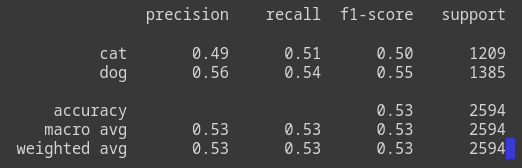

In [ ]:
cm = confusion_matrix(y_test_label, y_pred)
class_names = ['cat', 'dog']
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot()
plt.show()
#Note images we're loaded in from another notebook due to long run time. 

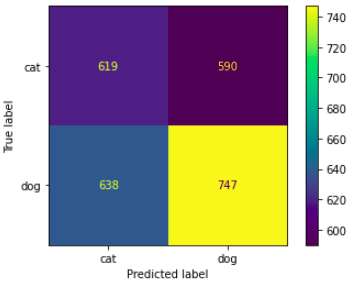

In [ ]:
expClassLog

,Model,Train Accuracy,Test Accuracy,CXE,F1 Score Test,Precision Test,Fit Time,Score Time,Description
0,Baseline Classification Model (SVC),0.608,0.594,NA,0.592,0.61,2865.42,196.63,{'clf': SVC(probability=True)}
1,Logistic Classification Model,0.541,0.54,15.871506,0.541,0.571,633.43,89.33,"{'lr__C': 1000.0, 'lr__penalty': 'l1'}"
2,SVC Classification Model,0.534,0.54,NA,0.524,0.554,422.14,104.99,"{'svc__C': 0.1, 'svc__kernel': 'rbf'}"
3,SGD Classification Model,0.536,0.527,NA,0.527,0.559,488.48,93.74,"{'sgd__loss': 'hinge', 'sgd__penalty': 'l1'}"


#2.12 Regression Pipeline

**Model Input Features - Images:**
The input for the models is images that have been rescaled, flattened into a 2D array, and image augmentation was performed. The pipelines with feature engineering also had histogram of oriented gradient (HOG) algorithm executed. 

**Model Target - Bounding Boxes:** 
 The target for this regression model is bounding box coordinates. 

The bounding box describes the spatial location of an object in an image. It is a rectangular box over the image and there are two ways of representing the bounding box: 

1. x and y coordinates of the upper left corner and the lower right corner of the rectangle. 

2. x,y coordinates of the bounding box center and the width and height of the box. 

This model predicts the following bounding box coordinates: 'XMin', 'YMin', 'XMax', 'YMax'. 

### Experiments:
Three experiments are conducted with the regression pipeline. 
1. Regression with Feature Selection (Baseline Model)
2. Regression with Feature Selection and Parameter Tuning
3. Regression with Parameter Tuning, but no feature selection. 

The regression pipeline is using the Mean squared error (MSE) loss function. The metrics we are using to compare experiments are Mean squared error (MSE), root mean square error (RMSE), and mean absolute error ( MAE). The MSE is recorded in our experiment log.

**MSE Equation:**
Loss function that works for multiple algorithms including linear regression


\begin{equation}\tag{Reference: Lab 4 Linear Regression}
MSE(\boldsymbol{\theta}) = f(\boldsymbol{\theta}) = \frac{1}{m}\sum_{i=1}^{m}\left[ \mathbf{x}_i\cdot\boldsymbol{\theta} - y_i\right]^2
\end{equation}


Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align}


**RMSE Equation**
Root mean squared error function is just the square root of the mean squared error




\begin{align}\tag{Reference: Lab 4 Linear Regression}
\text{RMSE}(\mathbf{X}, h_{\mathbf{\theta}}) 
=  \sqrt{\dfrac{1}{m} \sum\limits_{i=1}^{m}{( \mathbf{x}^{(i)}\cdot \mathbf{\theta} - y^{(i)})^2}}
\end{align}


Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align}


**MAE Equation**
Average of the absolute error values
\begin{align}\tag{Reference: Lab 4 Linear Regression}
\text{MAE}(\mathbf{X}, h_{\mathbf{\theta}}) = \dfrac{1}{m} \sum\limits_{i=1}^{m}{| \mathbf{x}^{(i)}\cdot \mathbf{\theta} - y^{(i)}|}
\end{align}


Notation:
\begin{align}
m &\quad \text{Number  of  examples in data set}\\
\mathbf{x}_i &\quad \text{input variable}\\
(\boldsymbol{\theta}) &\quad \text{model's parameter vector}\\
y &\quad \text{target class}\\
\end{align


More specific details for each experiment are explained below.

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y_bbox, test_size=0.2, random_state=42) 

In [ ]:
X_train.shape

(10372, 49152)

## 2.12.1 Regression with Feature Selection - **Baseline model**

Regression pipeline with preprocessing, feature selection, and scaling. No paramater tuning. We are testing the regression pipeline with linear regression and experimenting with regularization using ridge, lasso, and elastic net.


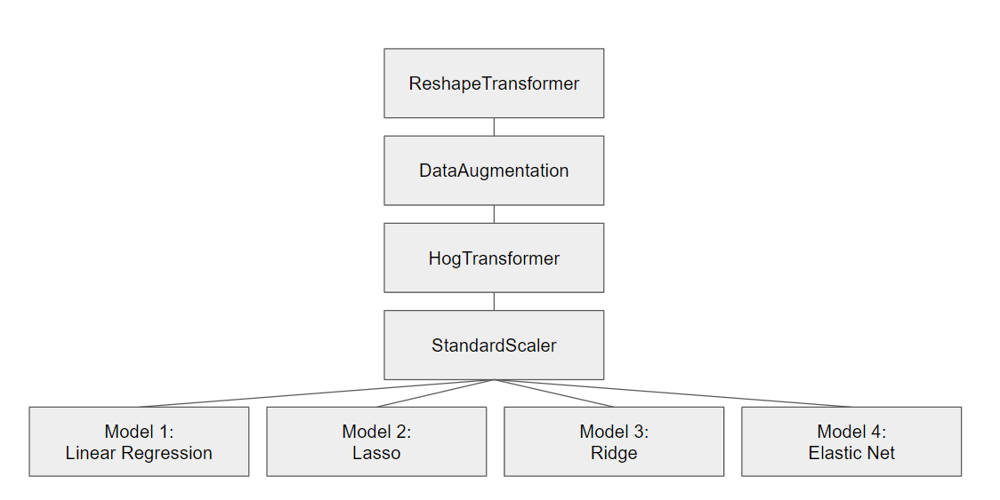

In [ ]:
reg_pipe_b = Pipeline([
    ('preprocessing', preprocessing_pipe),
    ('hog_transformer', HogTransformer(orientations=8, pixels_per_cell = (4,4))),
    (('scalar', StandardScaler())),
    ("reg", None)  # model place holder
    ])
display(reg_pipe_b) #display pipeline 

# Candidate learning estimators
estimators = [{'reg': [LinearRegression()]},
              {'reg': [Ridge()]},
              {'reg': [Lasso()]},
              {'reg': [ElasticNet()]}
              ]

# Fitting 5 folds for each of 4 candidates, totalling 20 fits
reg_gs_b = GridSearchCV(reg_pipe_b, param_grid=estimators, cv=5, n_jobs=16, scoring='neg_mean_squared_error')

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('reshape_transformer',
                                  ReshapeTransformer(shape=(128, 128, 3))),
                                 ('data_augmentation', DataAugmentation())])),
                ('hog_transformer', HogTransformer()),
                ('scalar', StandardScaler()), ('reg', None)])

In [ ]:
t1 = time()
reg_gs_b.fit(X_train, y_train)
t_total_test = time() - t1
print(t_total_test/60) #minutes

32.56419965028763


In [ ]:
results_df = pd.DataFrame(reg_gs_b.cv_results_)
display(results_df)
reg_pipeline = reg_gs_b.best_estimator_
print("\n\n")
print("-"*60)
print(f"Best pipeline is {reg_pipeline}")
best_model_b_lr = reg_gs_b.best_params_
print(f"Best model is {reg_gs_b.best_params_}")
# Print best accuracy score
scoring = 'neg_mean_squared_error'
score_train_reg = -reg_gs_b.best_score_
print("Best %s score: %0.3f" %(scoring, score_train_reg))
#Fit time
mean_fit_time_b = reg_gs_b.cv_results_['mean_fit_time'][reg_gs_b.best_index_]
mean_score_time_b = reg_gs_b.cv_results_['mean_score_time'][reg_gs_b.best_index_]
#note: you want to minimize mean squared error
#grid search was created to always maximize the score, 
#which means scores that are actually losses need to be changed to negative values to work with this
#Note images we're loaded in from another notebook due to long run time. 

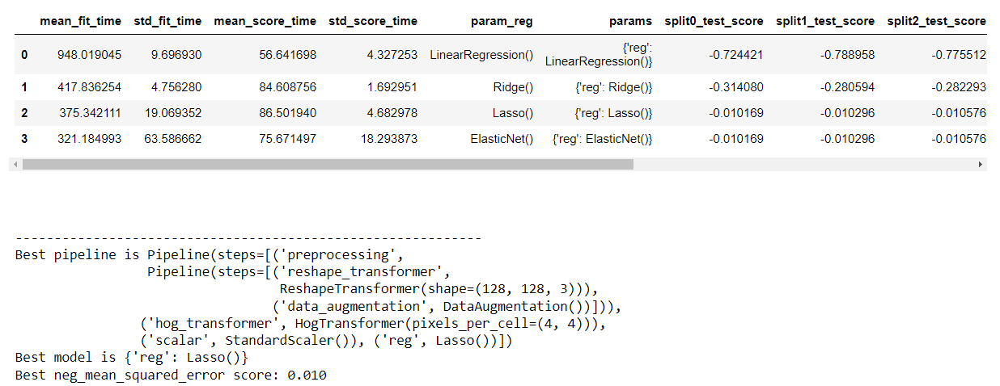

In [ ]:
#Test
t2 = time()
y_pred = reg_pipeline.predict(X_test)
t_total_test = time() - t2

mae_b = np.round(mean_absolute_error(y_pred, y_test), 3)
mse_b = np.round(mean_squared_error(y_pred, y_test),3)
rmse_b = np.round(np.sqrt(mean_squared_error(y_pred, y_test)), 3)

print('mae', mae_b)
print('mse', mse_b)
print('rmse', rmse_b)
#Note images we're loaded in from another notebook due to long run time.

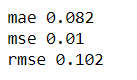

In [ ]:
## Log all experimental results - Create dataframe
experimentLog = pd.DataFrame(columns=["Pipeline", "Best Model", "Train CV Accuracy (MSE)", "Test Accuracy (MSE)",
                                               "Train Time",  "score Time", "Description",])

In [ ]:
# Log all experimental results
experimentLog.loc[len(experimentLog)] =[f"Baseline Regression Model",
                                        reg_gs_b.best_params_,
                                        score_train_reg, 
                                        mse_b, 
                                        mean_fit_time_b,
                                        mean_score_time_b,
                                        "Baseline regression pipeline with feature selection"]

experimentLog
#Note images we're loaded in from another notebook due to long run time.

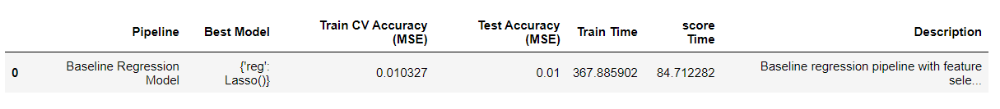

In [ ]:
# Try to create an image of predicted and true bounding boxes. 
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(X_test.shape[0], size=6, replace=False)):
    img = X_test[j].reshape(128,128,3)
    coords = y_pred[j] * 128
    coords_true = y_test[j] * 128
    ax[i].imshow(img)
    ax[i].set_title("Predicted: Red \n True: Green ")
    ax[i].add_patch(plt.Rectangle((coords[0], coords[1]), 
                                  coords[2]-coords[0], coords[3]-coords[1], 
                                  edgecolor='red', facecolor='none'))
    ax[i].add_patch(plt.Rectangle((coords_true[0], coords_true[1]), 
                                  coords_true[2]-coords_true[0], coords_true[3]-coords_true[1], 
                                  edgecolor='green', facecolor='none'))
plt.tight_layout()
plt.show()

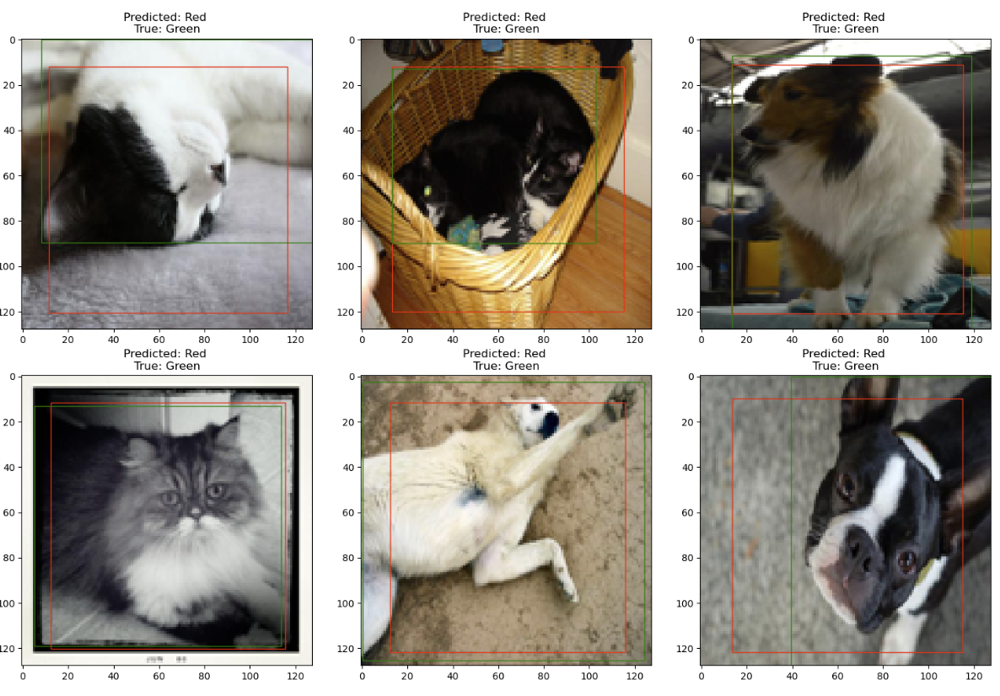

## 2.12.2 Regression with Feature Selection and Parameter Tuning

Regression pipeline with preprocessing, feature selection, and scaling. We are testing the regression pipeline with linear regression and experimenting with regularization using ridge, lasso, and elastic net. We are doing grid search with the following parameters: 

alpha: 0.01, 0.05, 1

tolerance: 0.001, 0.0001

* Alpha - Constant that multiplies the L1 or L2 term, controlling regularization strength.
* tol - tolerance for the stopping criteria. This tells scikit to stop searching for a minimum (or maximum) once some tolerance is achieved.


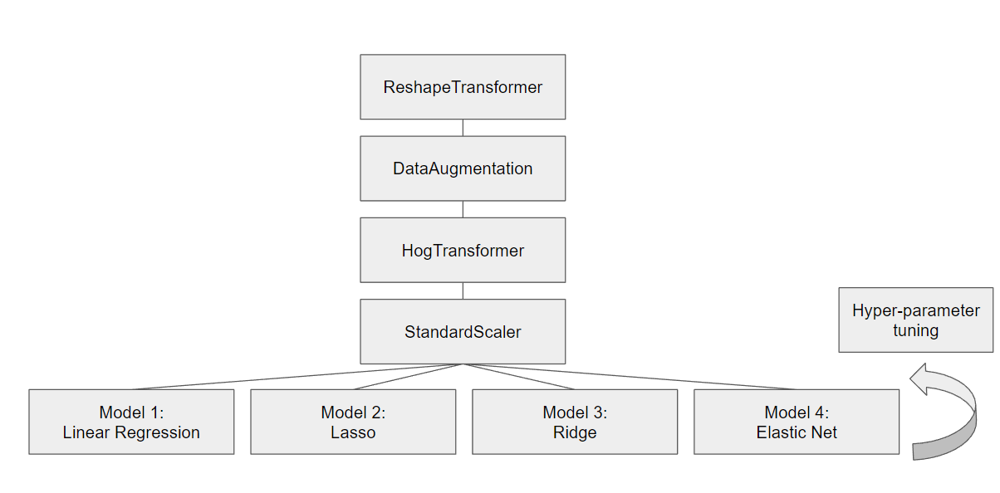

In [ ]:
#Compare Algorithms with feature selection

reg_pipe_fs = Pipeline([
    ('preprocessing', preprocessing_pipe),
    ('hog_transformer', HogTransformer(orientations=8, pixels_per_cell = (4,4))),
    (('scalar', StandardScaler())),
    ("reg", None)  # model place holder
    ])
display(reg_pipe_fs) #display pipeline 

# Candidate learning estimators
estimators = [{'reg': [LinearRegression()]},
              {'reg': [Ridge()],
               'reg__alpha': [.01, .05, 1],
               'reg__tol': [0.001, 0.0001]},
              {'reg': [Lasso()],
               'reg__alpha': [.01, .05, 1],
               'reg__tol': [0.001, 0.0001]},
              {'reg': [ElasticNet()],
               'reg__alpha': [.01, .05, 1],
               'reg__tol': [0.001, 0.0001]},
               ]

reg_gs_fs = GridSearchCV(reg_pipe_fs, param_grid = estimators, cv = 5, n_jobs=-1, scoring='neg_mean_squared_error')

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('reshape_transformer',
                                  ReshapeTransformer(shape=(128, 128, 3))),
                                 ('data_augmentation', DataAugmentation())])),
                ('hog_transformer', HogTransformer(pixels_per_cell=(4, 4))),
                ('scalar', StandardScaler()), ('reg', None)])

In [ ]:
t1 = time()
reg_gs_fs.fit(X_train, y_train)
t_total_test = time() - t1
print(t_total_test/60) #minutes
#Note images we're loaded in from another notebook due to long run time.

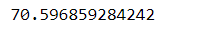

In [ ]:
results_df = pd.DataFrame(reg_gs_fs.cv_results_)
display(results_df)
reg_pipeline = reg_gs_fs.best_estimator_
print("\n\n")
print("-"*60)
print(f"Best pipeline is {reg_pipeline}")
best_model_fs_lr = reg_gs_fs.best_params_
print(f"Best model is {reg_gs_fs.best_params_}")
# Print best accuracy score
scoring = 'neg_mean_squared_error'
score_train_reg_fs = -reg_gs_fs.best_score_
print("Best %s score: %0.3f" %(scoring, score_train_reg))
#Fit time
mean_fit_time_fs = reg_gs_fs.cv_results_['mean_fit_time'][reg_gs_fs.best_index_]
mean_score_time_fs = reg_gs_fs.cv_results_['mean_score_time'][reg_gs_fs.best_index_]
#note: you want to minimize mean squared error
#grid search was created to always maximize the score, 
#which means scores that are actually losses need to be changed to negative values to work with this
#Note images we're loaded in from another notebook due to long run time.

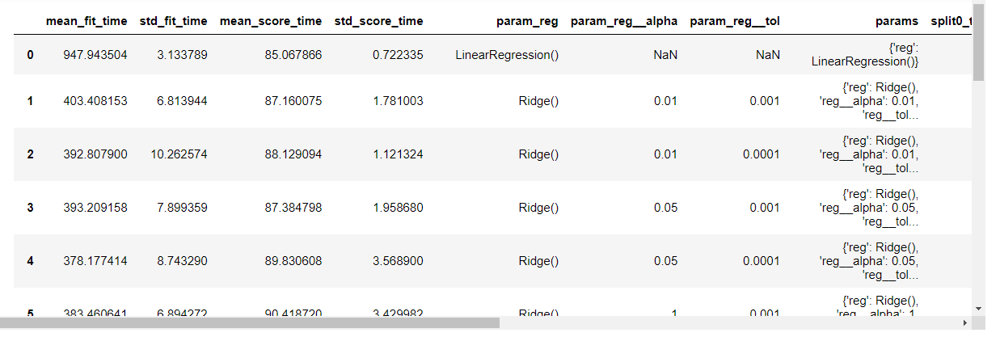

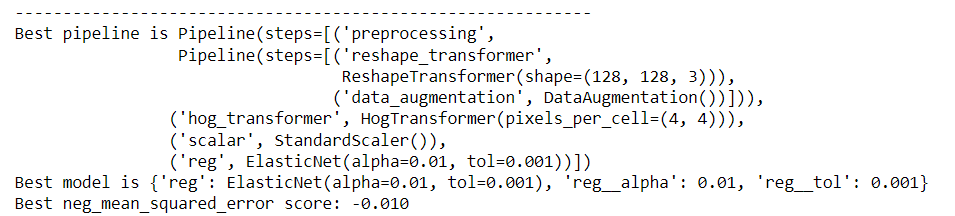

In [ ]:
#Test
t2 = time()
y_pred_fs = reg_pipeline.predict(X_test)
t_total_test = time() - t2

mae_fs = np.round(mean_absolute_error(y_pred_fs, y_test), 3)
mse_fs = np.round(mean_squared_error(y_pred_fs, y_test),3)
rmse_fs = np.round(np.sqrt(mean_squared_error(y_pred_fs, y_test)), 3)

print('mae', mae_fs)
print('mse', mse_fs)
print('rmse', rmse_fs)
#Note images we're loaded in from another notebook due to long run time.

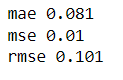

In [ ]:
# Log all experimental results
experimentLog.loc[len(experimentLog)] =[f"Regression with Feature Selection and Parameter Tuning", 
                                        score_train_reg_fs, 
                                        mse_fs, 
                                        mean_fit_time_fs,
                                        mean_score_time_fs,
                                        "Baseline regression pipeline with feature selection"]

experimentLog
#Note images we're loaded in from another notebook due to long run time.

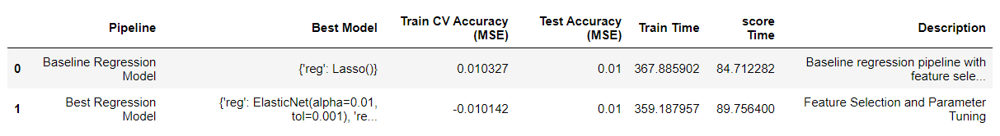

### 2.12.2.1 Image Visualization of predicted and true bounding boxes

In [ ]:
# Try to create an image of predicted and true bounding boxes. 
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(X_test.shape[0], size=6, replace=False)):
    img = X_test[j].reshape(128,128,3)
    coords = y_pred_fs[j] * 128
    coords_true = y_test[j] * 128
    ax[i].imshow(img)
    ax[i].set_title("Predicted: Red \n True: Green ")
    ax[i].add_patch(plt.Rectangle((coords[0], coords[1]), 
                                  coords[2]-coords[0], coords[3]-coords[1], 
                                  edgecolor='red', facecolor='none'))
    ax[i].add_patch(plt.Rectangle((coords_true[0], coords_true[1]), 
                                  coords_true[2]-coords_true[0], coords_true[3]-coords_true[1], 
                                  edgecolor='green', facecolor='none'))
plt.tight_layout()
plt.show()
#Note images we're loaded in from another notebook due to long run time.

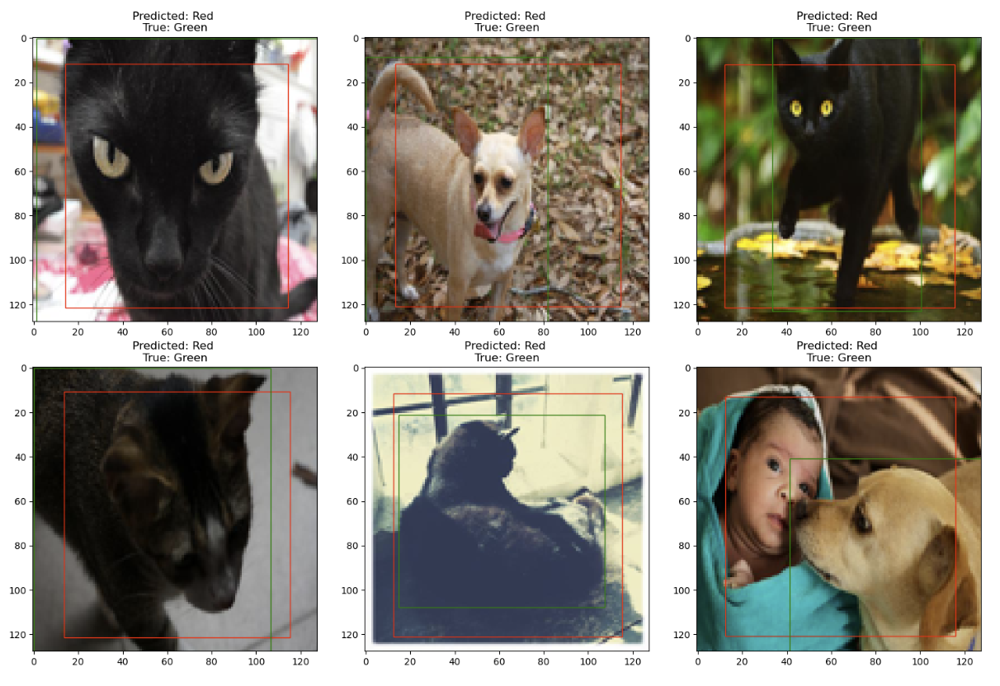

##2.12.3 Regression without Feature Selection
Regression pipeline with preprocessing and scaling. No feature selection is being performed. We are testing the regression pipeline with linear regression and experimenting with regularization using ridge, lasso, and elastic net. We are doing grid search with the following parameters: 

alpha: 0.01, 0.05, 1 

tolerance: 0.001, 0.0001 

* Alpha - Constant that multiplies the L1 or L2 term, controlling regularization strength.
* tol - tolerance for the stopping criteria. This tells scikit to stop searching for a minimum (or maximum) once some tolerance is achieved.

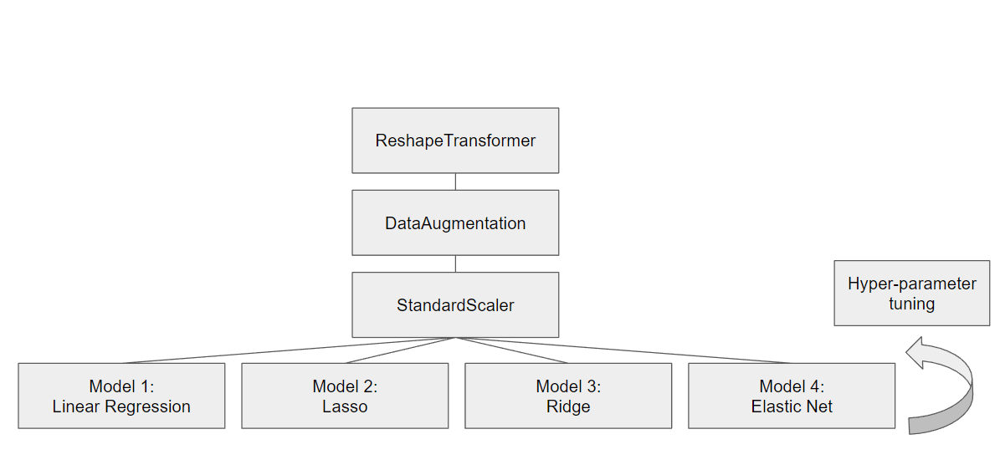

In [ ]:
#Test 2

#Compare Algorithms

reg_pipe = Pipeline([
        (('scalar', StandardScaler())),
        ("reg", None)  # model place holder
    ])
display(reg_pipe)

# Candidate learning estimators
estimators = [{'reg': [LinearRegression()]},
              {'reg': [Ridge()],
               'reg__alpha': [.01, .05, 1],
               'reg__tol': [0.001, 0.0001]},
              {'reg': [Lasso()],
               'reg__alpha': [.01, .05, 1],
               'reg__tol': [0.001, 0.0001]},
              {'reg': [ElasticNet()],
               'reg__alpha': [.01, .05, 1],
               'reg__tol': [0.001, 0.0001]},
               ]

#alpha - Constant that multiplies the L2 term, controlling regularization strength.

# tol - tolerance for the stopping criteria. This tells scikit to stop searching for a minimum 
# (or maximum) once some tolerance is achieved.

reg_gridsearch = GridSearchCV(reg_pipe, param_grid = estimators, cv = 5, n_jobs=-1, scoring='neg_mean_squared_error')

In [ ]:
t1 = time()
reg_gridsearch.fit(X_train, y_train)
t_total_train = time() - t1
print(t_total_train/60) #minutes

In [ ]:
results_df = pd.DataFrame(reg_gridsearch.cv_results_)
display(results_df)
reg_pipeline = reg_gridsearch.best_estimator_
print("\n\n")
print("-"*60)
print(f"Best pipeline is {reg_pipeline}")
best_model_gs_lr = reg_gridsearch.best_params_
print(f"Best model is {reg_gridsearch.best_params_}")
# Print best accuracy score
scoring = 'neg_mean_squared_error'
score_train_reg2 = -reg_gridsearch.best_score_
print("Best %s score: %0.3f" %(scoring, score_train_reg))
#Fit time
mean_fit_time2 = reg_gridsearch.cv_results_['mean_fit_time'][reg_gridsearch.best_index_]
mean_score_time2 = reg_gridsearch.cv_results_['mean_score_time'][reg_gridsearch.best_index_]
#note: you want to minimize mean squared error
#grid search was created to always maximize the score, 
#which means scores that are actually losses need to be changed to negative values to work with this function.

In [ ]:
#Test
t2 = time()
y_pred2 = reg_pipeline.predict(X_test)
t_total_test = time() - t2

mae2 = np.round(mean_absolute_error(y_pred2, y_test), 3)
mse2 = np.round(mean_squared_error(y_pred2, y_test), 3)
rmse2 = np.round(np.sqrt(mean_squared_error(y_pred2, y_test)), 3)

print('mae', mae2)
print('mse', mse2)
print('rmse', rmse2)

In [ ]:
# Log all experimental results
experimentLog.loc[len(experimentLog)] =[f"Regression without Feature Selection", 
                                        score_train_reg2, 
                                        mse2, 
                                        mean_fit_time2,
                                        mean_score_time2,
                                        "Baseline regression pipeline with feature selection"]

experimentLog

Evaluation

In [ ]:
# Try to create an image of predicted and true bounding boxes. 
fig, ax = plt.subplots(nrows=2, ncols=3, sharex=False, sharey=False,figsize=(15,10))
ax = ax.flatten()

for i,j in enumerate(np.random.choice(X_test.shape[0], size=6, replace=False)):
    img = X_test[j].reshape(128,128,3)
    coords = y_pred2[j] * 128
    coords_true = y_test[j] * 128
    ax[i].imshow(img)
    ax[i].set_title("Predicted: Red \n True: Green ")
    ax[i].add_patch(plt.Rectangle((coords[0], coords[1]), 
                                  coords[2]-coords[0], coords[3]-coords[1], 
                                  edgecolor='red', facecolor='none'))
    ax[i].add_patch(plt.Rectangle((coords_true[0], coords_true[1]), 
                                  coords_true[2]-coords_true[0], coords_true[3]-coords_true[1], 
                                  edgecolor='green', facecolor='none'))
plt.tight_layout()
plt.show()

## Run time issue: Could not successfully run this model due to hardware limitations. 

#2.16 Results and Discussion

###Classifier Models
###Results and Discussion

The dataframe shows 4 different classifiers:
-	Baseline Classification Model (SVC)
-	Logistic Regression Model
-	SVC Classification Model
-	SGD Classification Model

By looking at the table, we see Baseline SVC having a Test Accuracy of 59.4% which is slightly better than the other classifiers. We can also see that this classifier has the best train accuracy (60.8%), F1-Score Test (59.2%), Precision-Test (61%), Fit Time, and Score Time. Even though we ran these several classifiers, we know just by looking at their performance that these are not optimal for object detection tasks. We would like test and see how good deep learning techniques will help us achieve better results.




###Regression Models
### Results:
The regression model was built to predict an accurate bounding box around a cat or dog in an image. We accomplished this by using a linear regression model and we optimized the model by testing ridge, lasso, and elastic net regularization techniques. We conducted three experiments to optimize the models: regression with feature selection (baseline model), regression with feature selection and parameter tuning, regression with parameter tuning, but no feature selection. 

Lasso was the best performing model for the first experiment with feature selection. The training MSE was 0.01 and the testing MSE was 0.01. The model fit time was 375.3 second. 
The second experiment involved feature selection and parameter tuning. Hyper-parameter tuning was performed on Lasso, Ridge, and Elastic Net with the following parameters: Alpha: 0.01 and 0.05; Tolerance: 0.001 and 0.0001. Elastic Net with alpha 0.01 and tolerance 0.0001 was the best performing model. The fit time was 349.5 minutes. 
 

### Discussion:
We found that all of our results had low MSE scores indicating that the model performed well. After researching, we concluded that alternative methods to calculate accuracy would benefit our analysis. The method we found called intersection over union. This method measures the union of the predicted bounding box with the true bounding box. After researching machine learning techniques, we found that linear regression is not the optimal model for predicting bounding boxes. For future analysis, we would be interested in implementing neural networks and potentially trying Region Based Convolutional Neural Networks (R-CNN). This is a machine learning model for computer vision and specifically object detection. 



#2.17 Observations - Other

PCA main idea is dimensionality reduction. It is used for analyzing large datasets containing a high number of dimension/features per observation, increasing the interpretability of data while preserving the maximum amount of information. It will reduce dimensionality while retaining the most import components while sacrificing some amount of information.
While analyzing our image data, we calculated the “Explained variation per principal component” which was divided in 2 principal components:
-	1st component (21.2% of total variation in the data)
-	2nd component (8.8% of the total variation in the data)
The sum of these two values will give 30%, which represents the total amount of variation that is accounted by these two principal components.


We tried implementing this graph to calculate the number of “n_components” our PCA analysis needed. Based on the graph, we can see that 28 components intercept with approx. 72% max cumulative explained variance. We were thinking about using 28 components in our PCA test for dimensionality reduction, however due to time and resources no further experiment was done.

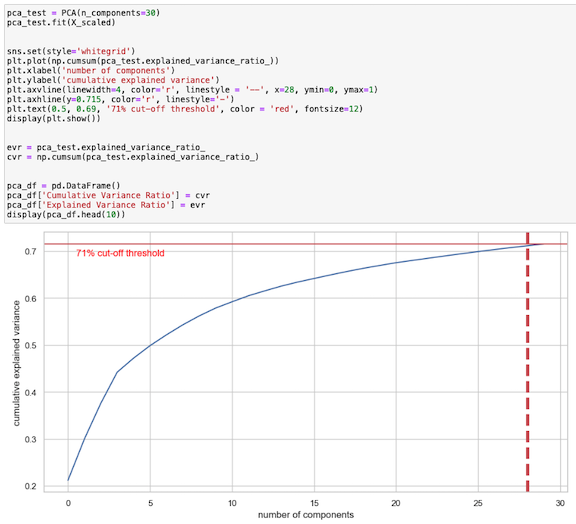

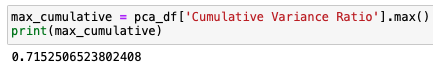

#2.18 Exploring Cloud Computing

During the end of the Phase 1 of this project and early stages of Phase 2, we have experienced the previously used Docker container crashing while training models using the cats and dogs dataset. We attempted to address it by installing Anaconda and running Jupyter Notebook directly on our computers. This however was still making training take hours while rendering our computers nearly unusable due to all the CPU and memory/RAM processing requirements. We explored Colab Pro and used Colab’s computing units which still were not providing a powerful enough environment to run the model training in reasonable time. We then started experimenting with custom GCE virtual machines to run our Google Colab code. We eventually addressed all the challenges with needing to load the data differently to all 3 environments. This distributed approach helped with spreading the computing load but since we aimed to submit only one Jupyter Notebook, we were still constrained to editing only one Notebook at a time. This and the strict time limit for the Phase 2 resulted in us running several pipelines in different environments and some were only shared in the main Notebook as screenshots.

#2.19 Conclusion
In conclusion, our project focuses on developing optimal cat and dog image detection machine learning techniques. Our goal is to improve accuracy in both our classification and regression models through implementing various preprocessing methods and utilizing a histogram of oriented gradients (HOG) algorithm for feature extraction. Our hypothesis is that by using these techniques, we can create more accurate models for image detection. Throughout this project, we have applied several preprocessing steps and developed both classification and regression models. We have used ridge, lasso and elasticnet to fine tune our models, and logistic regression with classifiers of stochastic gradient descent (SGD) and support vector (SVC) to compare the performances of our classification models. The results of our models are significant as we have created a benchmark for more accurate cat and dog image detection. In subsequent phases, we hope to refine the evaluation metrics and processing efficiency for faster and more accurate detection with a larger emphasis on run-times. 

#Bibliography

*Note: Any other reference might be within cell blocks along wide code.

https://medium.com/artificialis/multi-task-deep-learning-with-pytorch-8bf0787ce0e0

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html

sklearn.linear_model.LinearRegression — scikit-learn 1.2.2 documentation (taken from phase 2 starter notebook)

GCP on Colab:
https://medium.com/@senthilnathangautham/colab-gcp-compute-how-to-link-them-together-98747e8d940e

Colab Creation of a custom VM
https://storage.googleapis.com/openimages/web/download.html
https://research.google.com/colaboratory/marketplace.html

Latex equations in Markdown:
https://codesolid.com/using-latex-in-python/

Data Augmentation:
https://www.analyticsvidhya.com/blog/2019/08/3-techniques-extract-features-from-image-data-machine-learning-python/
https://towardsdatascience.com/data-augmentation-techniques-in-python-f216ef5eed69

Sklearn BaseEstimator/TransformerMixin:
https://www.section.io/engineering-education/custom-transformer/
https://towardsdatascience.com/creating-custom-transformers-using-scikit-learn-5f9db7d7fdb5
https://towardsdatascience.com/writing-your-own-scikit-learn-classes-for-beginners-1e4e7d4de203
https://scikit-learn.org/stable/modules/generated/sklearn.base.BaseEstimator.html
https://scikit-learn.org/stable/modules/generated/sklearn.base.TransformerMixin.html#sklearn.base.TransformerMixin


Feature Engineering with Hog Transformer:
https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_hog.html
https://www.analyticsvidhya.com/blog/2019/09/feature-engineering-images-introduction-hog-feature-descriptor/
https://www.analyticsvidhya.com/blog/2019/09/9-powerful-tricks-for-working-image-data-skimage-python/

https://kapernikov.com/tutorial-image-classification-with-scikit-learn/
https://www.thepythoncode.com/article/hog-feature-extraction-in-python
https://www.mathworks.com/help/matlab/creating_plots/image-types.html

Principal Component Analysis:
https://medium.com/data-science-365/principal-component-analysis-pca-with-scikit-learn-1e84a0c731b0
https://www.datacamp.com/tutorial/principal-component-analysis-in-python
https://www.mikulskibartosz.name/pca-how-to-choose-the-number-of-components/
https://towardsdatascience.com/machine-learning-step-by-step-6fbde95c455a

Computations:
Lab 4: Linear Regression
Lab 6: Probability Theory Naive Bayes
Lab 7: Logistic Regression Iris
